# Project 6 : CreditCard Users Churn Prediction

__Objective:__

1. Explore and visualize the dataset.
2. Build a classification model to predict if the customer is going to churn or not
3. Optimize the model using appropriate techniques
4. Generate a set of insights and recommendations that will help the bank

__Importing Necessary Libraries:__

In [1]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score,precision_score,recall_score
from sklearn import metrics
from sklearn import tree
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.impute import SimpleImputer

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    RandomForestClassifier)
from xgboost import XGBClassifier

__Importing Necessary Pandas:__

In [2]:
#Importing Data
ccUsers= pd.read_csv('BankChurners.csv')

#copying Data to prevent unwanted data Changes
df=ccUsers.copy()
print(f'This data set contains {df.shape[0]} rows and {df.shape[1]} columns.')

This data set contains 10127 rows and 22 columns.


__Viewing 5 Random Data in Dataset:__

In [3]:
#Printing 5 random data
np.random.seed(1)
df.sample(n=5)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Unnamed: 21
6498,712389108,Existing Customer,43,F,2,Graduate,Married,Less than $40K,Blue,36,...,2,2570.0,2107,463.0,0.651,4058,83,0.766,0.820,NaN
9013,718388733,Existing Customer,38,F,1,College,Unknown,Less than $40K,Blue,32,...,3,2609.0,1259,1350.0,0.871,8677,96,0.627,0.483,NaN
2053,710109633,Existing Customer,39,M,2,College,Married,$60K - $80K,Blue,31,...,2,9871.0,1061,8810.0,0.545,1683,34,0.478,0.107,NaN
3211,717331758,Existing Customer,44,M,4,Graduate,Married,$120K +,Blue,32,...,4,34516.0,2517,31999.0,0.765,4228,83,0.596,0.073,NaN
5559,709460883,Attrited Customer,38,F,2,Doctorate,Married,Less than $40K,Blue,28,...,4,1614.0,0,1614.0,0.609,2437,46,0.438,0.000,NaN


__Observation:__

* We notice there is an empty column in data set which turned to unamed when imported. We will be dropping that column.
* We also notice that our Target variable Attrition_Flag needs to be converted into a numerical variable

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 22 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10127.0,4.632596e+01,8.016814e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


__Observations:__

* Months_on_book, Credit_Limit, Total_Revolving_Bal, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Ct_Chng_Q4_Q1 might have outliers as the difference between the 75 percentile and the max is high.

__Dropping Columns:__

In [6]:
#Dropping Unnamed Column 
df.drop(columns='Unnamed: 21',inplace=True)
#Dropping CLIENTNUM column
df.drop(columns='CLIENTNUM',inplace=True)
df.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


__Data Pre-Processing:__

__Checking For Duplicate Data:__

In [7]:
if len (df[df.duplicated()])>0:
    print("\n***Number of duplicated values: ", len(df[df.duplicated()]))
    display(df[df.duplicated(keep=False)].sort_values(by=list(df.columns)).head())
else:
    print("\nThere are no duplicated Values.")


There are no duplicated Values.


__Checking For Missing Values:__

In [8]:
#Checking for missing Data
pd.DataFrame( df.isnull().sum(), columns= ['Total Missing Values']) #Counted Missing will be displayed in new column

,Total Missing Values
Attrition_Flag,0
Customer_Age,0
Gender,0
Dependent_count,0
Education_Level,0
Marital_Status,0
Income_Category,0
Card_Category,0
Months_on_book,0
Total_Relationship_Count,0


__Observation:__
* There are no missing data

In [9]:
#Using this fuction below to generate a Profile Report
from pandas_profiling import ProfileReport
profile = ProfileReport(df)
profile
#This alllow allows us to get a summary of the data we are working with, get a better understanding and complete EDA requirement.

Summarize dataset:   0%|          | 0/34 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [10]:
#Checking for unique features in each column
df_ = df.select_dtypes(exclude=['int', 'float'])
for col in df_.columns:
    print(df_[col].unique()) # Printing each values
    print(df_[col].value_counts()) # Printing number of occurence for values

['Existing Customer' 'Attrited Customer']
Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
['M' 'F']
F    5358
M    4769
Name: Gender, dtype: int64
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
['Married' 'Single' 'Unknown' 'Divorced']
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64
['Blue' 'Gold' 'Silver' 'Platinum']
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: i

__Observation:__
* We notice that Education Level Column contains ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate' 'Doctorate']. After carefull consideration, it's safer to leave column as it is.

  0%|          | 0/1313 [00:00<?, ?it/s]


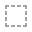
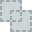
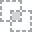
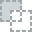
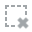
...
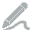
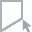
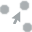
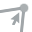
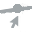

In [11]:
#Using dataprep.eda for graphing
from dataprep.eda import plot
plot(df)

__Perform an Exploratory Data Analysis on the data:__

__Univariate Analysis:__

In [12]:
#import sweetviz as sv

#my_report = sv.analyze(df)
#my_report.show_html() # Default arguments will generate to "SWEETVIZ_REPORT.html"

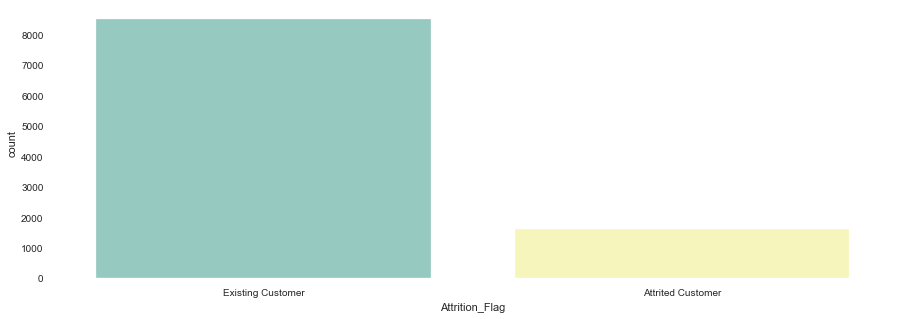

In [13]:
fig, ax = plt.subplots()
fig.set_size_inches(15, 5)
sns.countplot(df["Attrition_Flag"], palette="Set3")

In [14]:
df.groupby('Attrition_Flag').count()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
Attrition_Flag,,,,,,,,,,,,,,,,,,,
Attrited Customer,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627,1627
Existing Customer,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500,8500


__Observation:__
* We notice that there is a higher number of customer exisiting customer than Attrited customer which clearly reflects that the data is imbalanced which we will need to address.

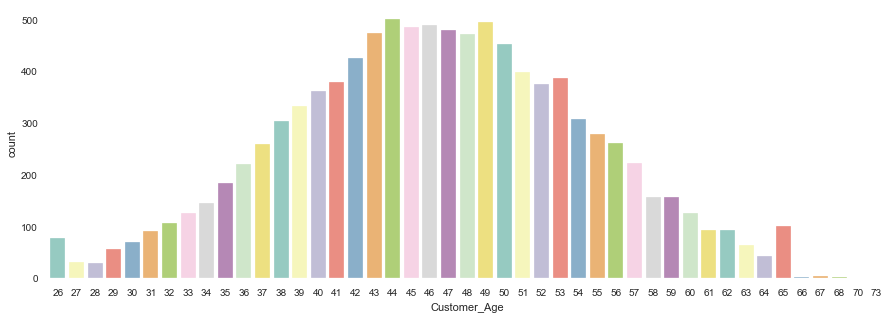

In [15]:
  fig, ax = plt.subplots()
  fig.set_size_inches(15, 5)
  sns.countplot(df['Customer_Age'], palette="Set3")

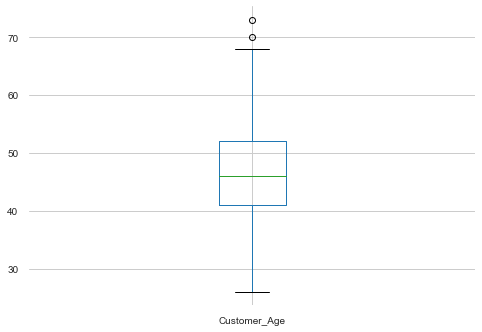

In [16]:
df.boxplot('Customer_Age')

__Observation:__

* We see that the Minimum Age for the customer is 26 and the maximum is 73. We can also detect few outliers from the box plot.

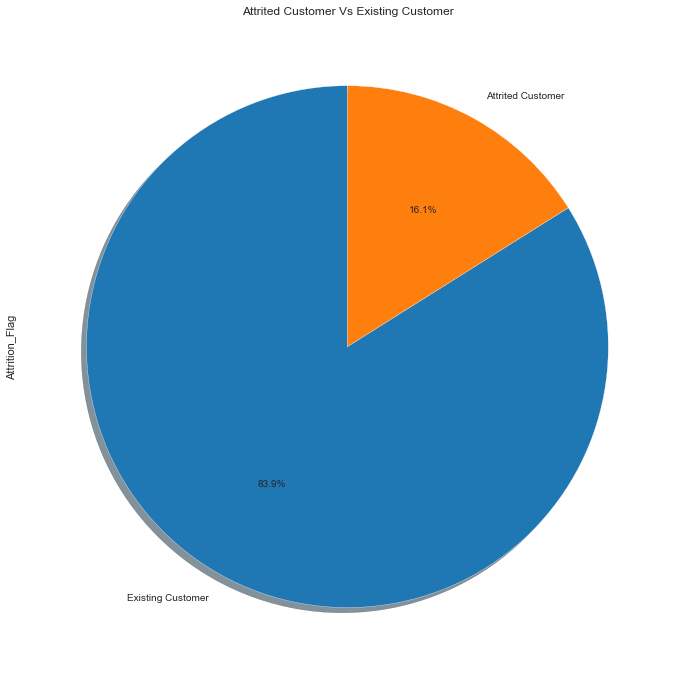

In [17]:
df.Attrition_Flag.value_counts().plot(kind='pie', figsize=(13,12), subplots=True, shadow = True,startangle=90, autopct='%1.1f%%')
plt.title("Attrited Customer Vs Existing Customer")
plt.show()

__Observation:__

* The Attrition_Flag Column contains Existing customer or 1 which is 83.9% (8500 people) of the people in the data set. The Attrited Customer or 0 is about 16.1% (1627 people). 

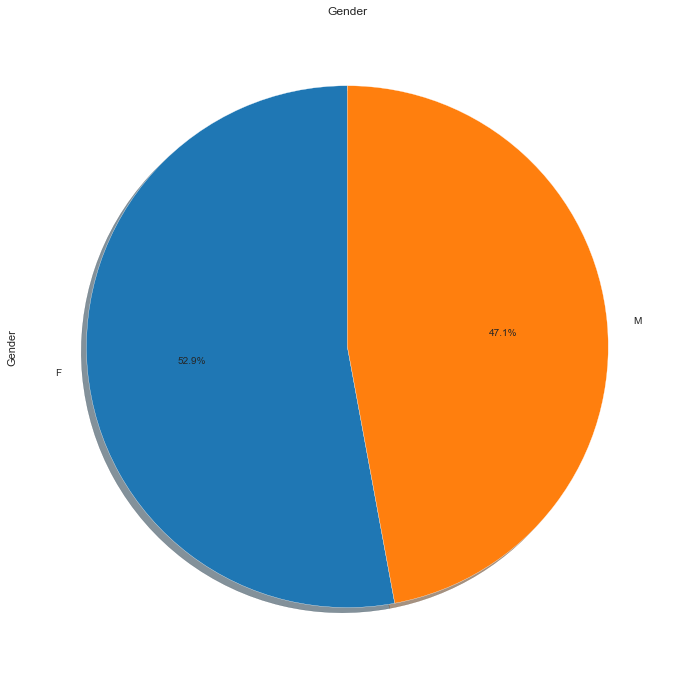

In [18]:
df.Gender.value_counts().plot(kind='pie',figsize=(13,12), subplots=True, shadow = True,startangle=90, autopct='%1.1f%%')
plt.title("Gender")
plt.show()

__Observations:__

* 52.9% (5358 people) of the People are Female which is represented by F and 47.1% (4769 people) are Male which is represented by M.

3    2732
2    2655
1    1838
4    1574
0     904
5     424
Name: Dependent_count, dtype: int64

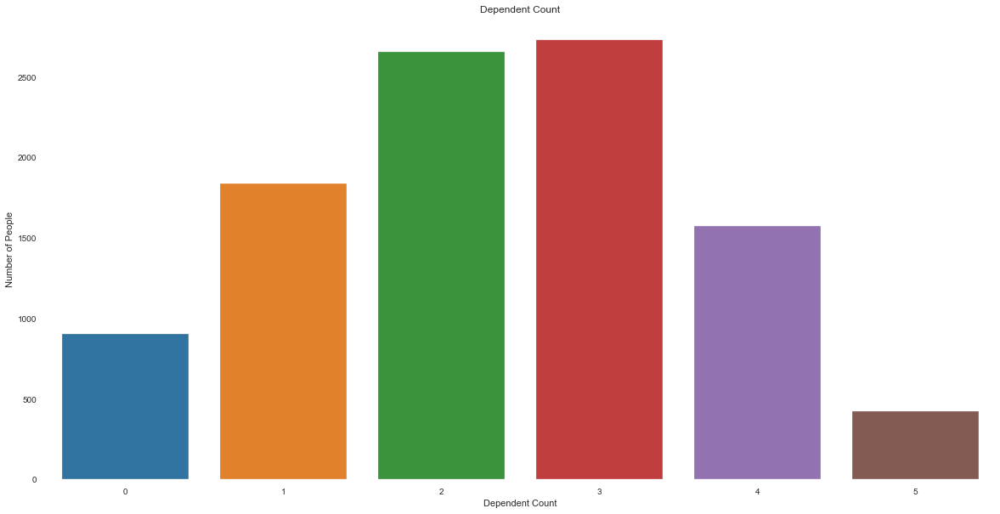

In [19]:
plt.figure(figsize=(20,10))                #Adjusting plot width to 20 and height to 10
sns.countplot(x='Dependent_count', data=df)         #Ploting graph to see number of People living in each Tier
plt.title('Dependent Count')          #Name that will be assigned to plot
plt.ylabel('Number of People')             #Label (name) for Y axis
plt.xlabel('Dependent Count')           #Label (name) for X axis

df['Dependent_count'].value_counts(ascending=False) #Counting number of People living in each Tier

__Observation:__

* The first group people (1627 people) in this dataset have 3 dependents.
* The second group of people (2655 people) have at least 2 dependents.
* The third group of people (1838 people )have at least 2 Dependents.
* The fourth group of people (904 people) have at 0 Dependents.
* The last group of people have (424 people) have 5 dependents.


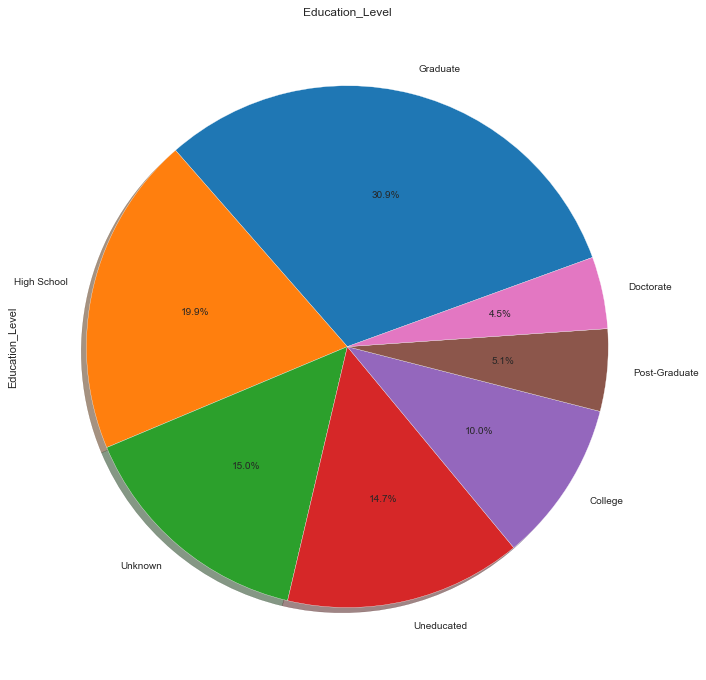

In [20]:
df.Education_Level.value_counts().plot(kind='pie',figsize=(13,12), subplots=True, shadow = True,startangle=20, autopct='%1.1f%%')
plt.title("Education_Level")
plt.show()

__Observations:__
* Most people in this data set are graduates: 30.89 % (3128)
* The second highest number of people in this data set finished high school: 19.88% (2013)
* The third highest number of people in this data set have unknown education level: 15% (1519) 
* The fourth highest number of people in this data set are uneducated: 14.68% (1487)
* The Fifth highest number of people in this data set finished College: 10.00%(1013)
* The sixth highest number of people in this data set finished their Post-Graduate Education: 5.10% (516)
* The seventh highest number of people in this data set finished theit Doctorate degree: 4.45%(451)

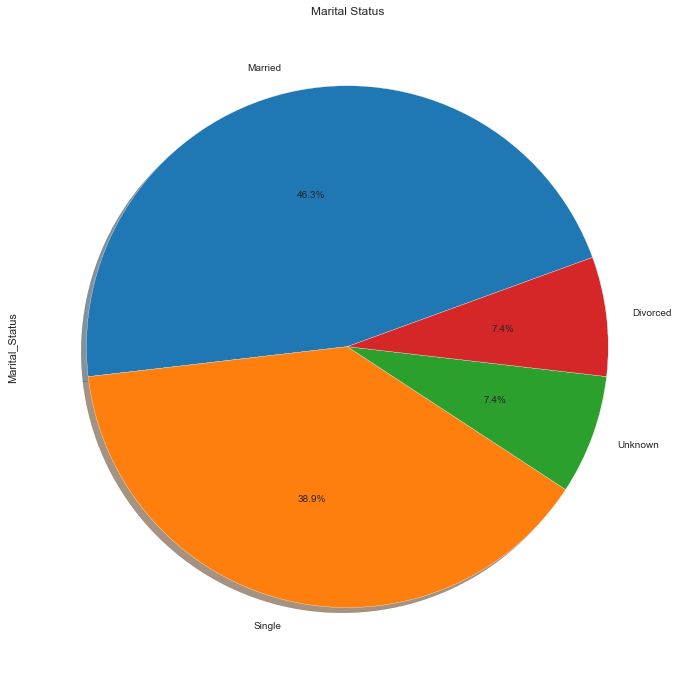

In [21]:
df.Marital_Status.value_counts().plot(kind='pie', figsize=(13,12), subplots=True, shadow = True,startangle=20, autopct='%1.1f%%')
plt.title("Marital Status")
plt.show()

__Observation:__
* The first highest number of people in the data set are married: 46.28%(4687)
* The Second highest number of people in the data set are Single: 38.94% (3943)
* The third highest number of marital status in the data set is Unknown: 7.40% (749)
* The fourth highest number of people in the data set are divorced: 7.39% (748)
    

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64

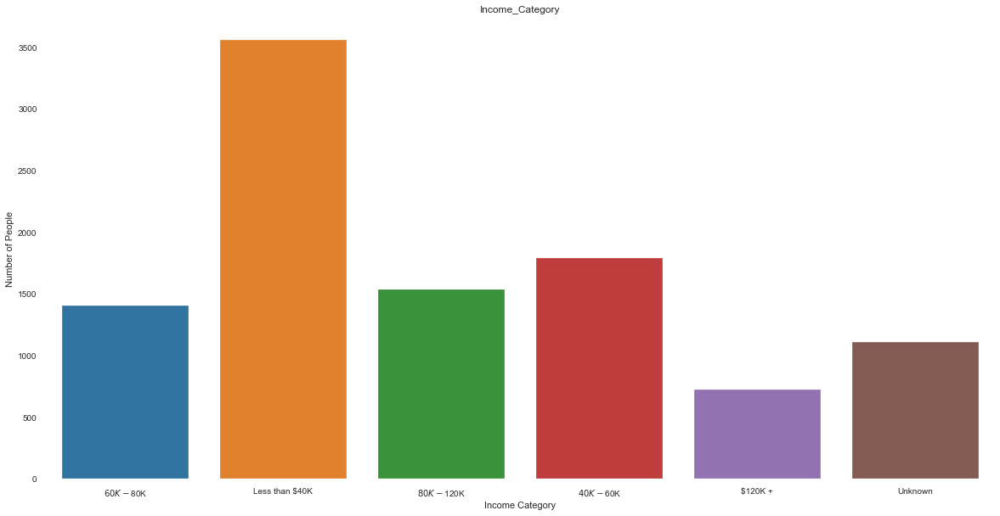

In [22]:
plt.figure(figsize=(20,10))                #Adjusting plot width to 20 and height to 10
sns.countplot(x='Income_Category', data=df)         #Ploting graph to see number of People living in each Tier
plt.title('Income_Category')          #Name that will be assigned to plot
plt.ylabel('Number of People')             #Label (name) for Y axis
plt.xlabel('Income Category')           #Label (name) for X axis

df['Income_Category'].value_counts(ascending=False) #Counting number of People living in each Tier

__Observations:__

* Most people in this dataset make less than 40k: 35.16% (3561 people)
* The second group of people makes between 40K - 60K: 17.68% (1790 people)
* The third group of people makes between 80K - 120K: 15.16% (1535 people)
* The fourth group of people makes between 60K - 80K: 13.84% (1402 people)
* The fifth group of people income category is unknown:10.98% (1112 people)
* The sixth group of people makesmore than 120K: 7.18% (727 people)

Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64

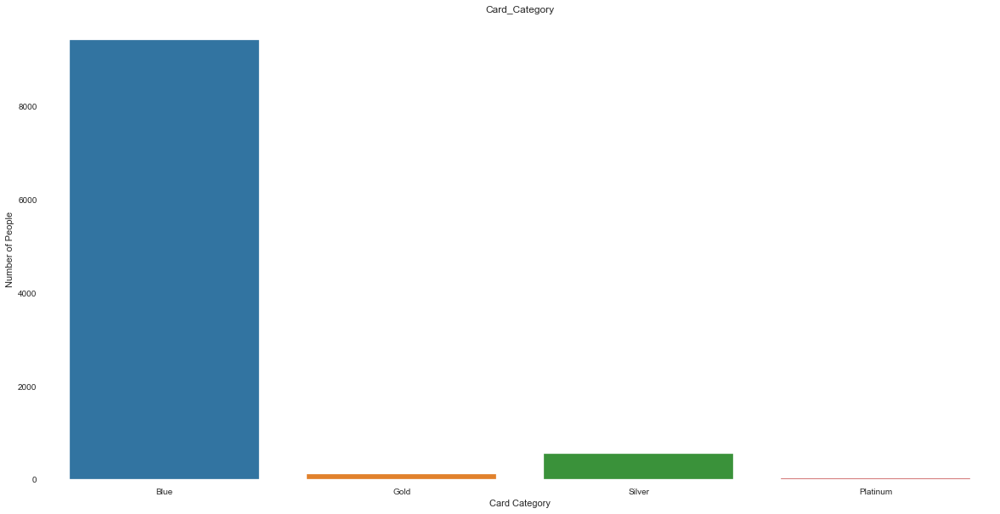

In [23]:
plt.figure(figsize=(20,10))                #Adjusting plot width to 20 and height to 10
sns.countplot(x='Card_Category', data=df)         #Ploting graph to see number of People living in each Tier
plt.title('Card_Category')          #Name that will be assigned to plot
plt.ylabel('Number of People')             #Label (name) for Y axis
plt.xlabel('Card Category')           #Label (name) for X axis

df['Card_Category'].value_counts(ascending=False) #Counting number of People living in each Tier

__Observation:__
* Most people have the Blue Card Category: 93.18% (9436 people)
* The Second most popular Card Category is Silver: 5.48% (555 people)
* The third most popular Card category is Gold: 1.15% (116)
* The fourth most popular Card Category is Platinium: 0.20% (20)

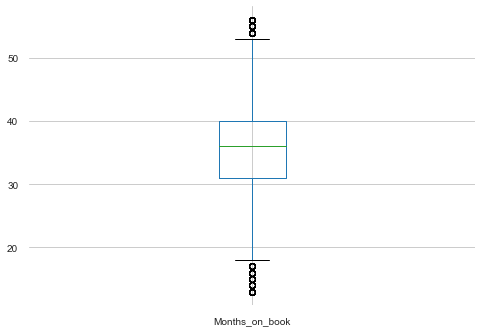

In [24]:
df.boxplot('Months_on_book')

__Oberservation:__

* We notice that the data has some outliers that we will need to remove.
* We also notice that most customer have had a relationship with the bank for at least 35 -36 months.

3    2305
4    1912
5    1891
6    1866
2    1243
1     910
Name: Total_Relationship_Count, dtype: int64

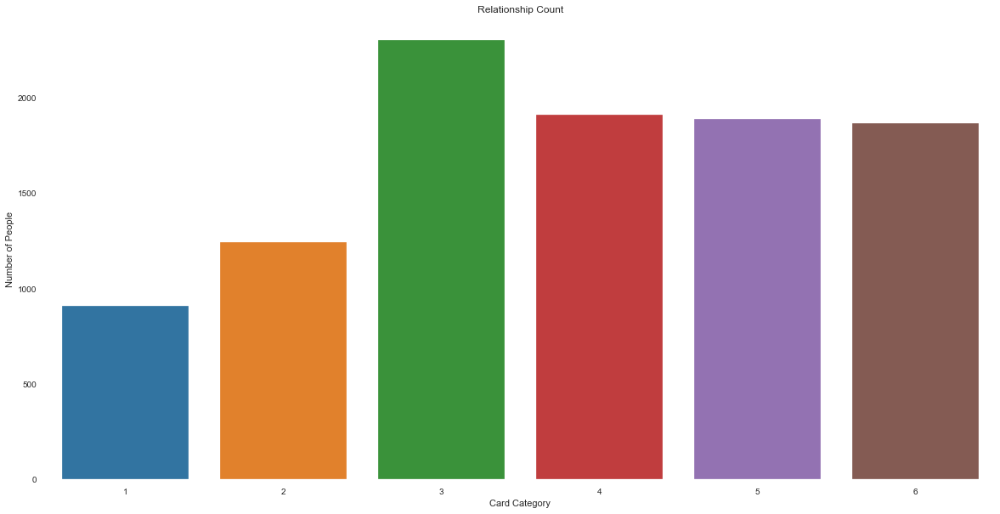

In [25]:
plt.figure(figsize=(20,10))                #Adjusting plot width to 20 and height to 10
sns.countplot(x='Total_Relationship_Count', data=df)         #Ploting graph to see number of People living in each Tier
plt.title('Relationship Count')          #Name that will be assigned to plot
plt.ylabel('Number of People')             #Label (name) for Y axis
plt.xlabel('Card Category')           #Label (name) for X axis

df['Total_Relationship_Count'].value_counts(ascending=False) #Counting number of People living in each Tier

__Oberservation:__
* Here we see that a lot of members have a 3 cards: 22.76% (2305)
* The second highest group has 4 cards: 18.88% (1812)
* The third highest group has 5 cards: 18.67% (1891)
* The fourth highest group has 6 Cards: 18.43% (1866)
* The fifth highest group has 2 cards: 12.27%(1243)
* The last group of people have 1 card: 8.99% (910)

3    3846
2    3282
1    2233
4     435
5     178
6     124
0      29
Name: Months_Inactive_12_mon, dtype: int64

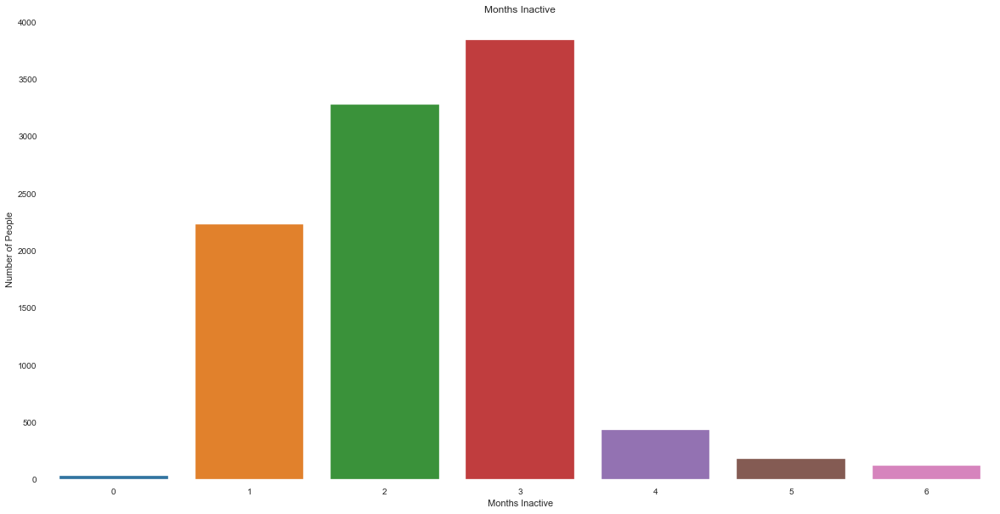

In [26]:
plt.figure(figsize=(20,10))                #Adjusting plot width to 20 and height to 10
sns.countplot(x='Months_Inactive_12_mon', data=df)         #Ploting graph to see number of People living in each Tier
plt.title('Months Inactive')          #Name that will be assigned to plot
plt.ylabel('Number of People')             #Label (name) for Y axis
plt.xlabel('Months Inactive')           #Label (name) for X axis

df['Months_Inactive_12_mon'].value_counts(ascending=False) #Counting number of People living in each Tier

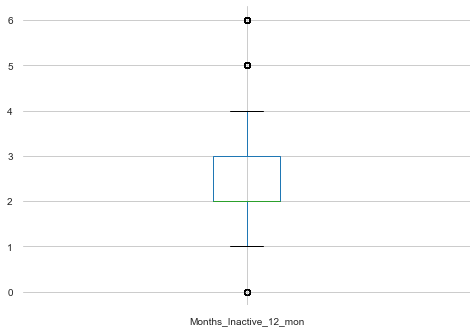

In [27]:
df.boxplot('Months_Inactive_12_mon')

__Observation:__
* We right away notice few outliers that we will need to address.
* We also notice that out of the last 12 months 37.98% (3846 customers) were inactive.
* The Second highest number of inactive customers is 32.41%( 3282 customers)and they were inactive for 2 months.
* The third highest number of inactive customers is 22.85%( 2233 customers)and they were inactive for 1 months.
* We also had .29% (29) customers that were inactive for few days or weeks (less than 1 month).

3    3380
2    3227
1    1499
4    1392
0     399
5     176
6      54
Name: Contacts_Count_12_mon, dtype: int64

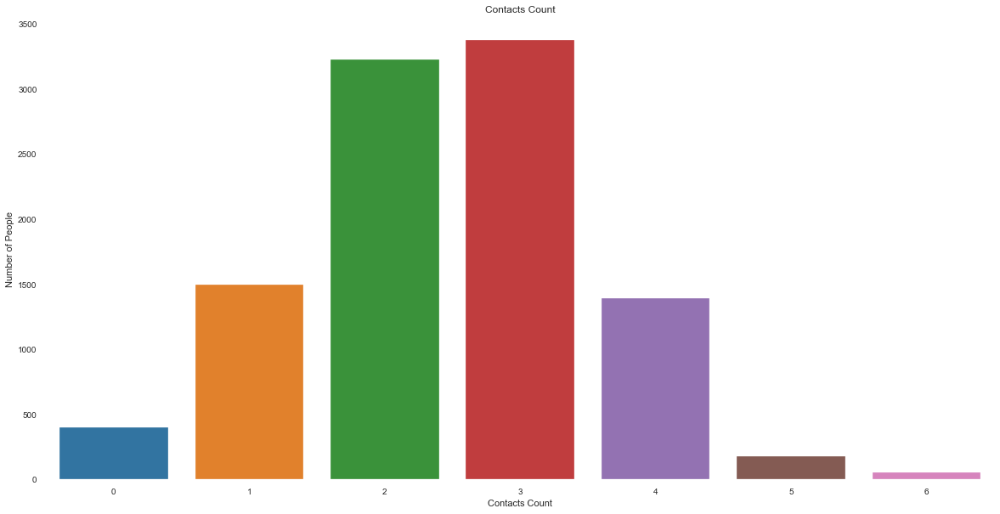

In [28]:
plt.figure(figsize=(20,10))                #Adjusting plot width to 20 and height to 10
sns.countplot(x='Contacts_Count_12_mon', data=df)         #Ploting graph to see number of People living in each Tier
plt.title('Contacts Count')          #Name that will be assigned to plot
plt.ylabel('Number of People')             #Label (name) for Y axis
plt.xlabel('Contacts Count')           #Label (name) for X axis

df['Contacts_Count_12_mon'].value_counts(ascending=False) #Counting number of People living in each Tier

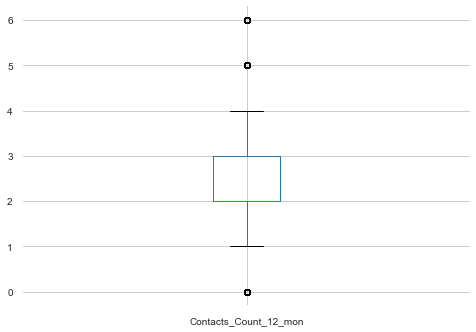

In [29]:
df.boxplot('Contacts_Count_12_mon')

__Observations:__
* We notice that we have few outliers.
* We also see that 33.80% (3380 people) of people contacted 3 times over the last 12 months.
* We see that 31.87% (3227 people) of people contacted 2 times over the the last 12 months.
* We see that 14.80% (1499 people) people contacted 1 times over the the last 12 months.
* We see that 3.94% (399 people) people contacted 0 times over the the last 12 months.
* We see that 13.75% (1392 people) people contacted 4 times over the the last 12 months.
* We see that 1.74% (176 people) people contacted 5 times over the the last 12 months.
* We see that 0.53% (54 people) people contacted 6 times over the the last 12 months.

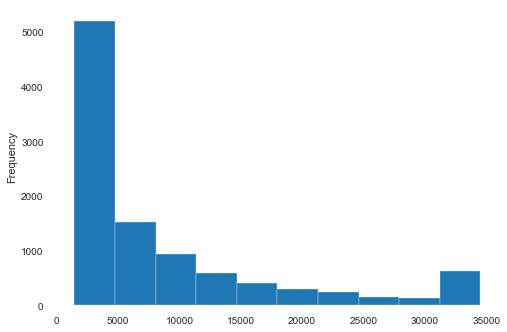

In [30]:
df.Credit_Limit.plot(kind="hist")

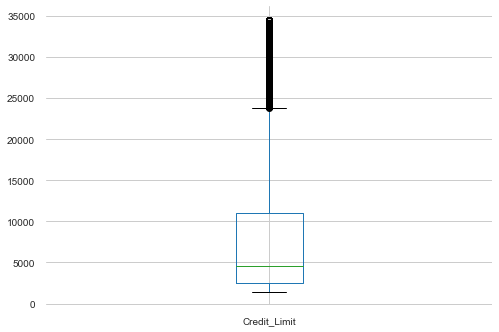

In [31]:
df.boxplot('Credit_Limit')

__Observations:__
* We see that most people have a minimum of 1438.3 credit limit and a max of 34516
* We also have few outliers

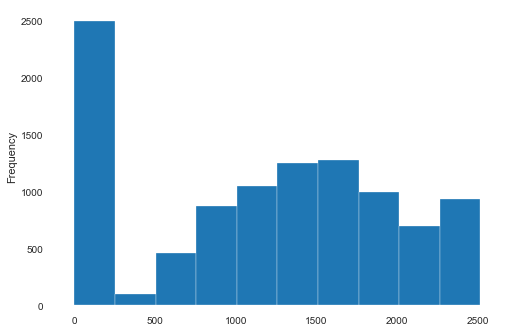

In [32]:
df.Total_Revolving_Bal.plot(kind="hist")

__Observations:__
* We see that most people have a minimum of 0 balance and a max of 2517


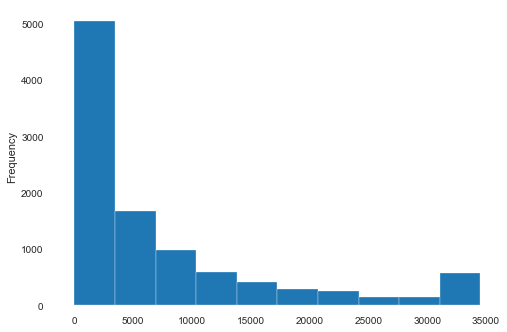

In [33]:
df.Avg_Open_To_Buy.plot(kind="hist")

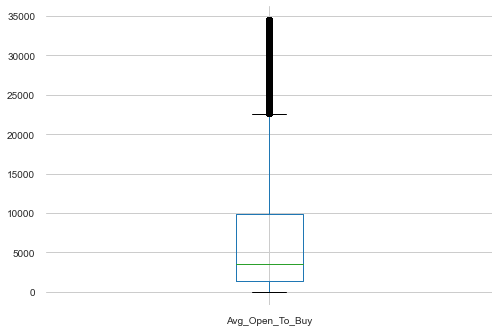

In [34]:
df.boxplot('Avg_Open_To_Buy')

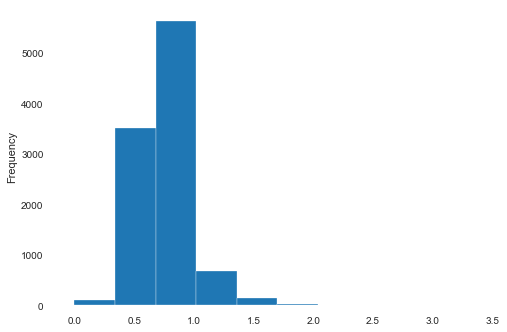

In [35]:
df.Total_Amt_Chng_Q4_Q1.plot(kind="hist")

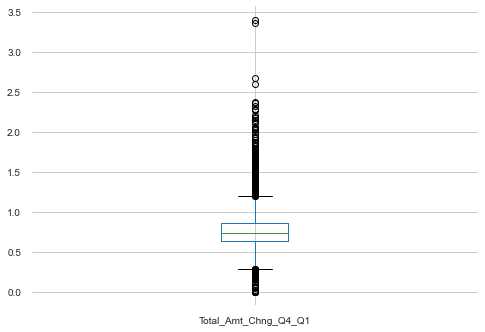

In [36]:
df.boxplot('Total_Amt_Chng_Q4_Q1')

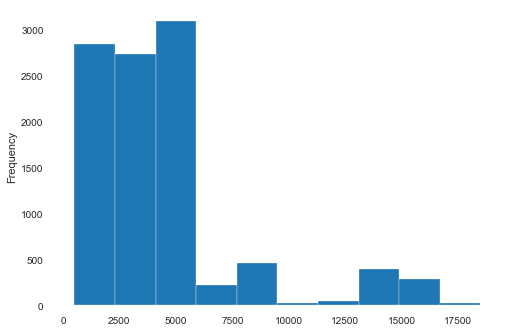

In [37]:
df.Total_Trans_Amt.plot(kind="hist")

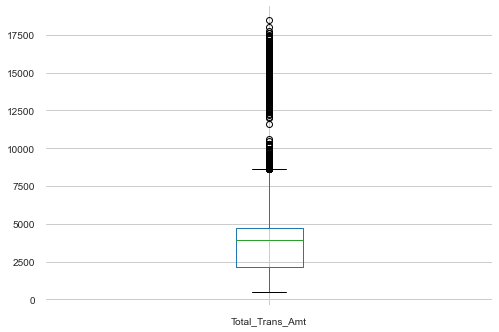

In [38]:
df.boxplot('Total_Trans_Amt')

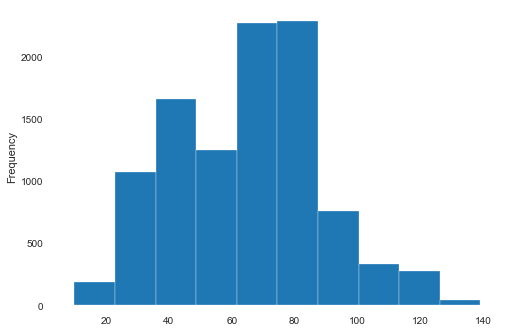

In [39]:
df.Total_Trans_Ct.plot(kind="hist")

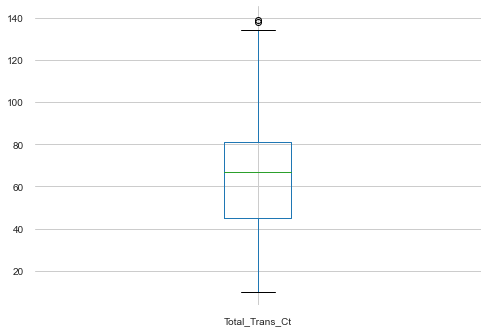

In [40]:
df.boxplot('Total_Trans_Ct')

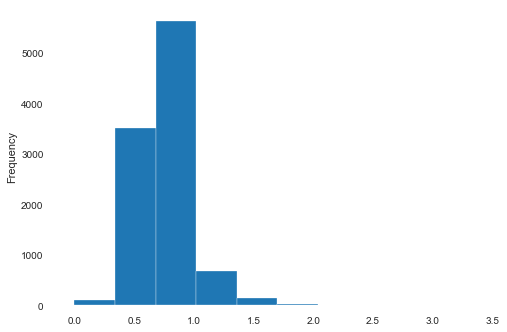

In [41]:
df.Total_Amt_Chng_Q4_Q1.plot(kind="hist")

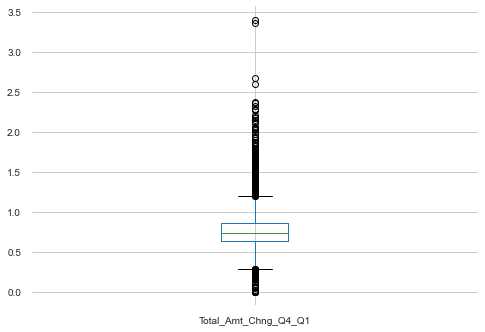

In [42]:
df.boxplot('Total_Amt_Chng_Q4_Q1')

__Observations:__

* We see that Total_Amt_Chng_Q4_Q1 seems to have a lot of outliers

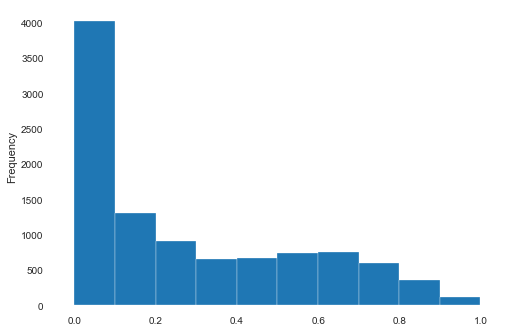

In [43]:
df.Avg_Utilization_Ratio.plot(kind="hist")

__Multivariate Analysis:__

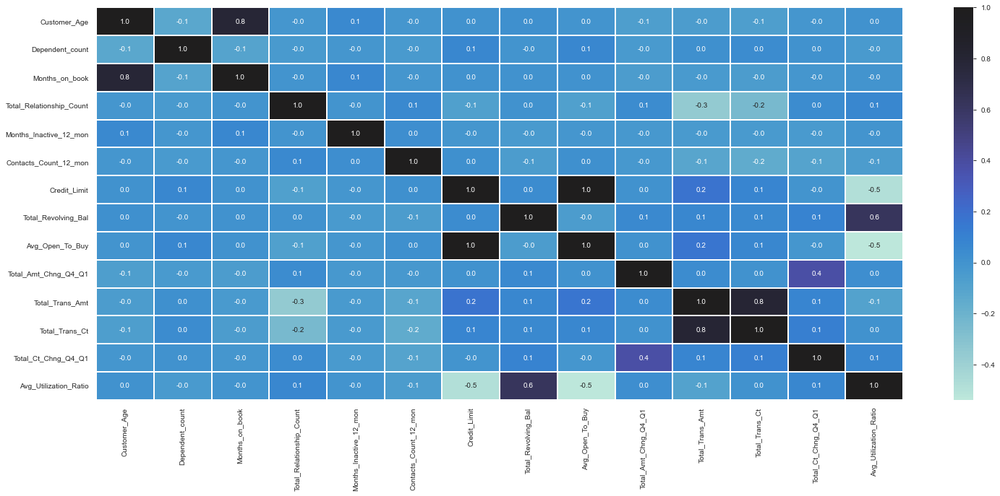

In [44]:
plt.figure(figsize=(25,10))
sns.heatmap(df.corr(), annot=True, linewidths=1, fmt= '.01f', center = 1 )  # heatmap
plt.show()
#The heatmap below is an example of Multivariate Analysis

__Observations:__

* As expected, we can see a high correlation between Customer_Age and Months_on_books
* As expected, we can see a high correlation between Total_Revolving_Bal and Avg_Utilization_Ratio


In [45]:
df.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

Text(0.5, 1.0, 'Attrition_Flag vs Customer_Age')

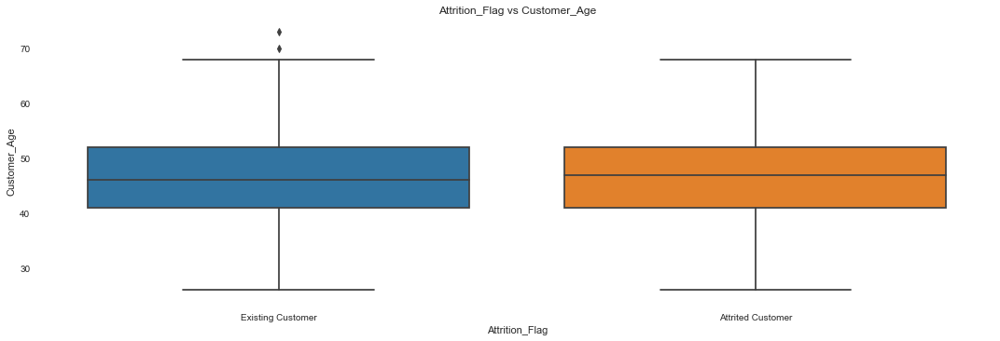

In [46]:
#Plotting Box Plot to show Passport vs ProdTaken
sns.catplot(x="Attrition_Flag", y="Customer_Age", kind = "box", data=df, height=5, aspect=3)
plt.title('Attrition_Flag vs Customer_Age')#Plot title

Text(0.5, 0, 'Months on Books')

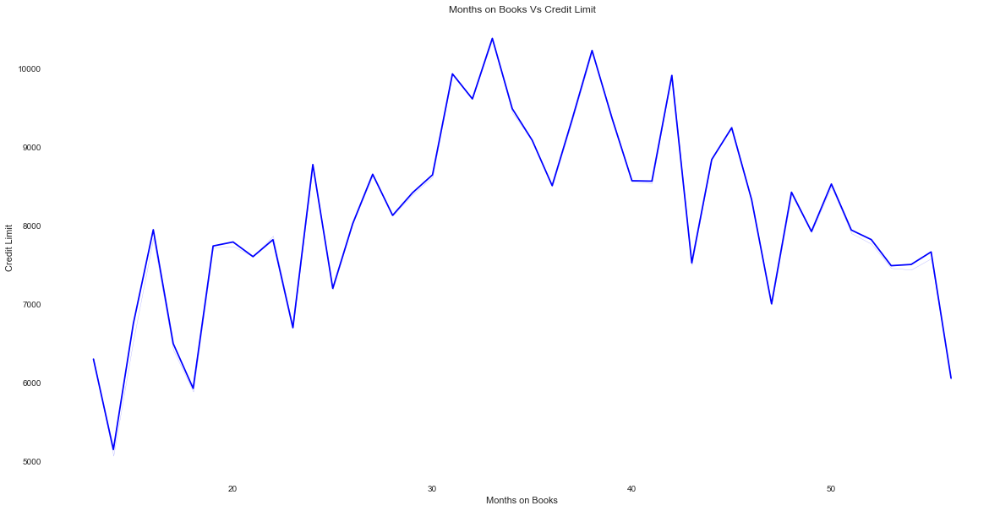

In [47]:
plt.figure(figsize=(20,10)) #Adjusting plot width to 20 and height to 10

sns.lineplot(y="Credit_Limit", x="Months_on_book",data=df,ci=0,color="BLUE")

plt.title('Months on Books Vs Credit Limit')                 #Plot title
plt.ylabel('Credit Limit')                           #Label (name) for Y axis
plt.xlabel('Months on Books')                         #Label (name) for X axis

__Observation:__

* We notice that the lenght of the relationship with the bank does not really have an effect on the credit limit which suggests there might be other criteria for assigning credit limit.

Text(0.5, 0, 'Months_Inactive_12_mon')

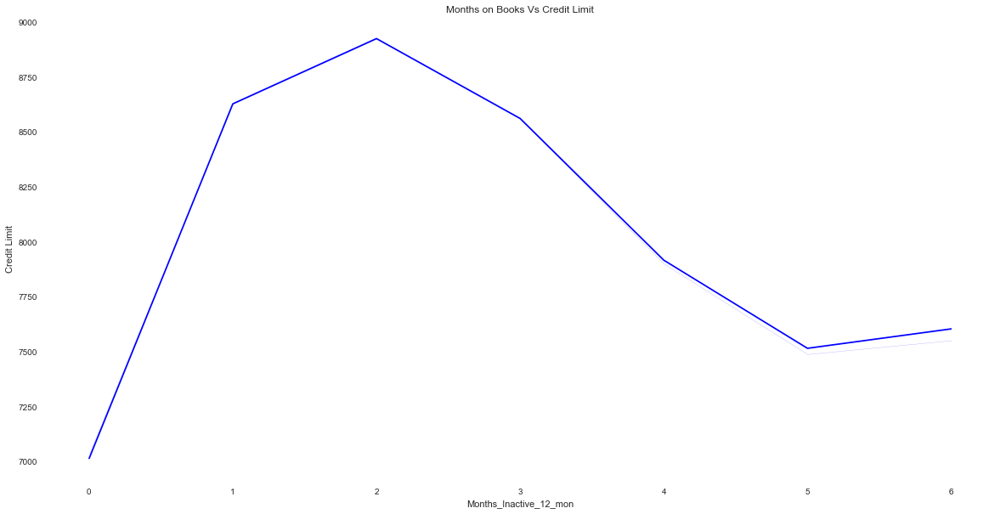

In [48]:
plt.figure(figsize=(20,10)) #Adjusting plot width to 20 and height to 10

sns.lineplot(y="Credit_Limit", x="Months_Inactive_12_mon",data=df,ci=0,color="BLUE")

plt.title('Months on Books Vs Credit Limit')                 #Plot title
plt.ylabel('Credit Limit')                            #Label (name) for Y axis
plt.xlabel('Months_Inactive_12_mon')                         #Label (name) for X axis

__Observation:__
* We see that the Credit limit starts to decrease after about 2 months of inactivity.
* Based on this decline and our general knowledge on banking system, we can assume that the bank starts reducing the customer's credit limit.

Text(0.5, 0, 'Card_Category')

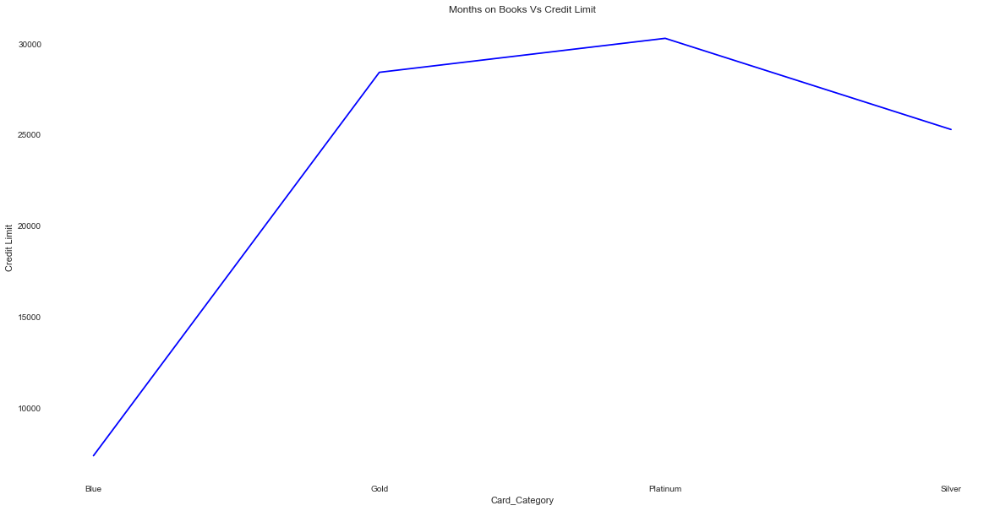

In [49]:
plt.figure(figsize=(20,10)) #Adjusting plot width to 20 and height to 10

sns.lineplot(y="Credit_Limit", x="Card_Category",data=df,ci=0,color="BLUE")

plt.title('Months on Books Vs Credit Limit')                 #Plot title
plt.ylabel('Credit Limit')                           #Label (name) for Y axis
plt.xlabel('Card_Category')                         #Label (name) for X axis

__Observation:__

* We can see that people with Gold and Platinum membership have the highest credit limit with the bank
* Silver members are the second members with high limits

Text(0.5, 1.0, 'Education_Level vs Credit Limit')

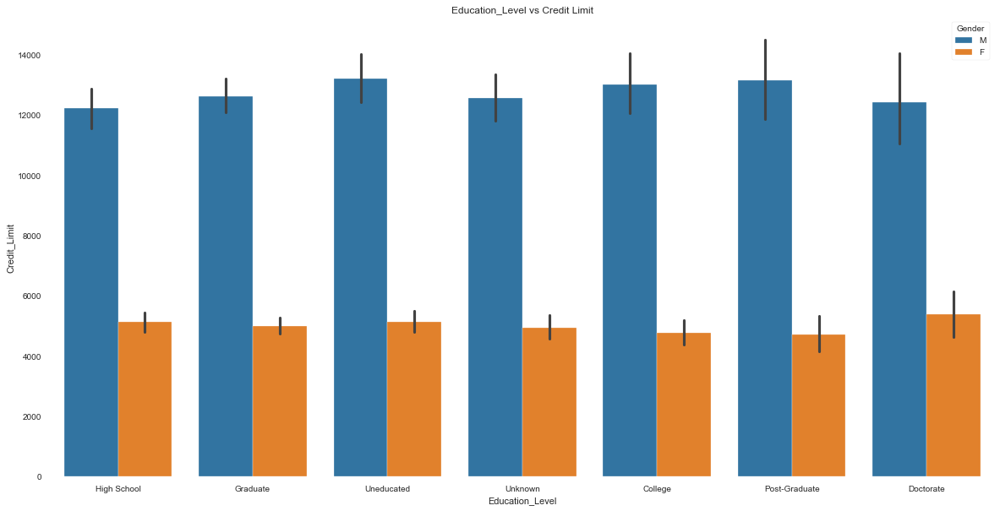

In [50]:
plt.figure(figsize=(20,10))           #Adjusting plot width to 20 and height to 10
sns.barplot(x="Education_Level", y="Credit_Limit", hue="Gender", data=df)
plt.title('Education_Level vs Credit Limit') #Plot title

Text(0.5, 1.0, 'Income_Category vs Credit Limit')

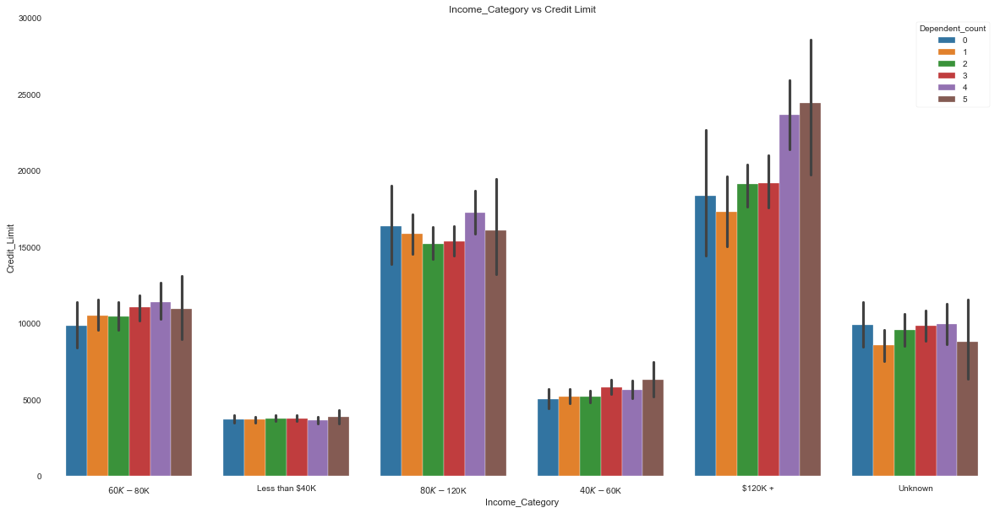

In [51]:
plt.figure(figsize=(20,10))           #Adjusting plot width to 20 and height to 10
sns.barplot(x="Income_Category", y="Credit_Limit", hue="Dependent_count", data=df)
plt.title('Income_Category vs Credit Limit') #Plot title

Text(0.5, 1.0, 'Marital_Status vs Credit Limit')

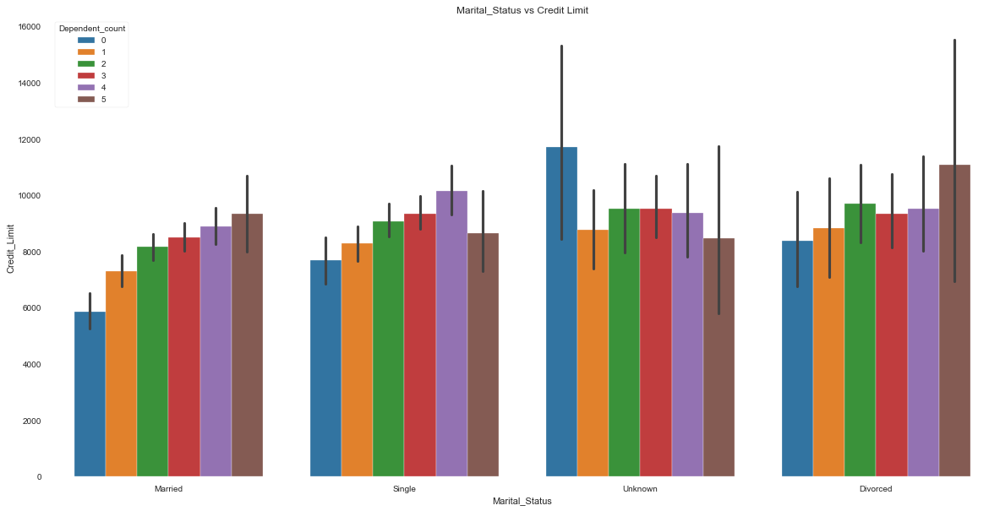

In [52]:
plt.figure(figsize=(20,10))           #Adjusting plot width to 20 and height to 10
sns.barplot(x="Marital_Status", y="Credit_Limit", hue="Dependent_count", data=df)
plt.title('Marital_Status vs Credit Limit') #Plot title

Text(0.5, 1.0, 'Marital_Status vs Dependent_count')

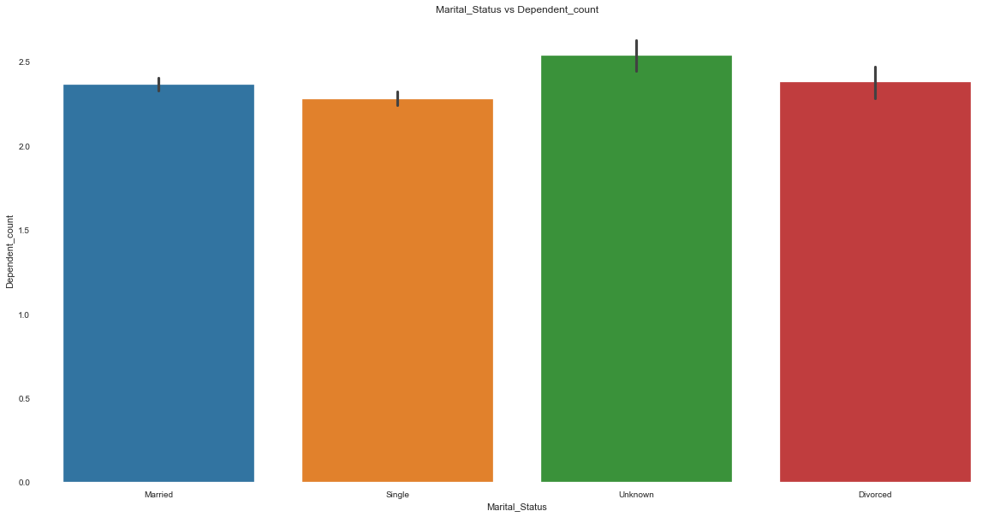

In [53]:
plt.figure(figsize=(20,10))           #Adjusting plot width to 20 and height to 10
sns.barplot(x="Marital_Status", y="Dependent_count", data=df)
plt.title('Marital_Status vs Dependent_count') #Plot title

Text(0.5, 1.0, 'Total_Amt_Chng_Q4_Q1 vs Gender')

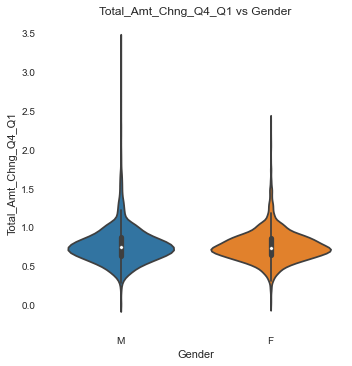

In [54]:
#Plotting Violin Plot to show Product vs Miles
sns.catplot(y="Total_Amt_Chng_Q4_Q1", x="Gender",kind="violin", data=df)
plt.title('Total_Amt_Chng_Q4_Q1 vs Gender')       #Plot Title

Text(0.5, 1.0, 'Product vs Miles')

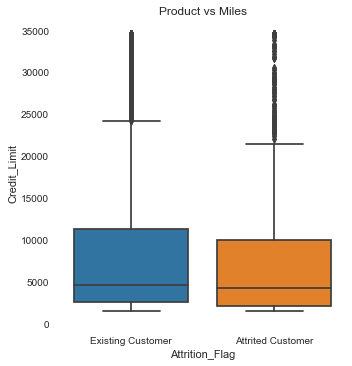

In [55]:
#Plotting Violin Plot to show Product vs Miles
sns.catplot(y="Credit_Limit", x="Attrition_Flag",kind="box", data=df)
plt.title('Product vs Miles')       #Plot Title

In [56]:
#Converting the categorical variable into numerical Variable
ColsToConvert =  ['Attrition_Flag']
#Map function
def binary_map(x):
    return x.map({'Existing Customer': 1, "Attrited Customer": 0})
#Applying the function to list
df[ColsToConvert] = df[ColsToConvert].apply(binary_map)
#Checking if Change was successfull
df

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,1,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,1,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,1,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,1,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,0,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,0,44,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,0,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [57]:
#Checking for unique features in each column
df_ = df.select_dtypes(exclude=['int', 'float'])
for col in df_.columns:
    print(df_[col].unique()) # Printing each values
    print(df_[col].value_counts()) # Printing number of occurence for values

['M' 'F']
F    5358
M    4769
Name: Gender, dtype: int64
['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
['Married' 'Single' 'Unknown' 'Divorced']
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64
['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64
['Blue' 'Gold' 'Silver' 'Platinum']
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64


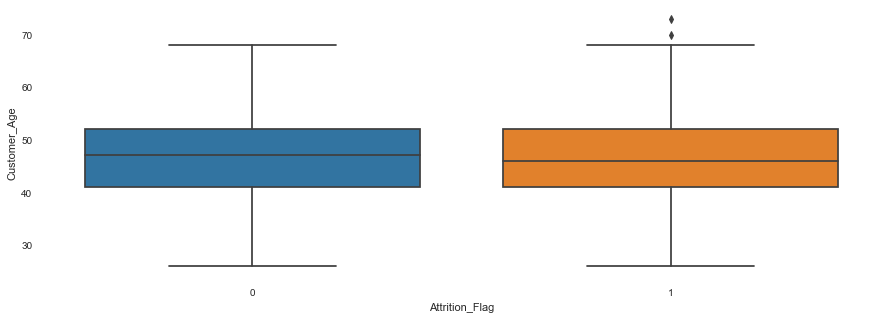

In [58]:
plt.figure(figsize=(15,5))
sns.boxplot(y='Customer_Age',x='Attrition_Flag',data=df)
plt.show()

__Dealing With Outliers:__

* We noticed outliers in Months_on_book, Credit_Limit, Total_Revolving_Bal, Total_Revolving_Bal, Avg_Open_To_Buy, Total_Amt_Chng_Q4_Q1, Total_Trans_Amt, Total_Ct_Chng_Q4_Q1 as the difference between the 75 percentile and the max is high and as reflected on the graphs. After further review, it is best to leave the outliers in the data as they do exist in the real world as well.

__Data Preparation:__

In [59]:
'''
Education_Level = {'Unknown':1, 'Uneducated':2, 'High School':3, 'College':4, 'Graduate':5, 'Post-Graduate':6,'Doctorate':7 }
df['Education_Level']=df['Education_Level'].map(Education_Level).astype('Int32')
Marital_Status = {'Married':1,'Single':2, 'Divorced':3, 'Unknown':4}
df['Marital_Status']=df['Marital_Status'].map(Marital_Status).astype('Int32')
Income_Category = {'Unknown':1,'Less than $40K':2,'$40K - $60K':3, '$60K - $80K':4, '$80K - $120K':5,'$120K +': 6 }
df['Income_Category']=df['Income_Category'].map(Income_Category).astype('Int32')
Card_Category = {'Blue':1,'Silver':2,'Gold':3, 'Platinum':4}
df['Card_Category']=df['Card_Category'].map(Card_Category).astype('Int32')
Gender = {'M':1,'F':2}
df['Gender']=df['Gender'].map(Gender).astype('Int32')
'''


"\nEducation_Level = {'Unknown':1, 'Uneducated':2, 'High School':3, 'College':4, 'Graduate':5, 'Post-Graduate':6,'Doctorate':7 }\ndf['Education_Level']=df['Education_Level'].map(Education_Level).astype('Int32')\nMarital_Status = {'Married':1,'Single':2, 'Divorced':3, 'Unknown':4}\ndf['Marital_Status']=df['Marital_Status'].map(Marital_Status).astype('Int32')\nIncome_Category = {'Unknown':1,'Less than $40K':2,'$40K - $60K':3, '$60K - $80K':4, '$80K - $120K':5,'$120K +': 6 }\ndf['Income_Category']=df['Income_Category'].map(Income_Category).astype('Int32')\nCard_Category = {'Blue':1,'Silver':2,'Gold':3, 'Platinum':4}\ndf['Card_Category']=df['Card_Category'].map(Card_Category).astype('Int32')\nGender = {'M':1,'F':2}\ndf['Gender']=df['Gender'].map(Gender).astype('Int32')\n"

In [60]:
df.head(10)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,1,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,1,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,1,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,1,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,1,44,M,2,Graduate,Married,$40K - $60K,Blue,36,3,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,1,51,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,1,32,M,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,1,37,M,3,Uneducated,Single,$60K - $80K,Blue,36,5,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,1,48,M,2,Graduate,Single,$80K - $120K,Blue,36,6,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


__Split the data into train and test sets:__

In [61]:
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split

# Separating target variable
X = df.drop(columns="Attrition_Flag")
Y = df["Attrition_Flag"]

#Seperating data into Train and test
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=1, stratify=Y)
print('The Train data shape {}. \nThe Test data shape {}.'.format(X_train.shape, X_test.shape))

The Train data shape (7088, 19). 
The Test data shape (3039, 19).


__Enconding Categorical Variables:__

In [62]:
X_train=pd.get_dummies(X_train,drop_first=True)
X_test=pd.get_dummies(X_test,drop_first=True)
print(X_train.shape, X_test.shape)

(7088, 32) (3039, 32)


__Logistic Regression:__

In [63]:
lReg = LogisticRegression(random_state = 1)
#Fitting logistic regression model to training data set 
lReg.fit(X_train, y_train)

LogisticRegression(random_state=1)

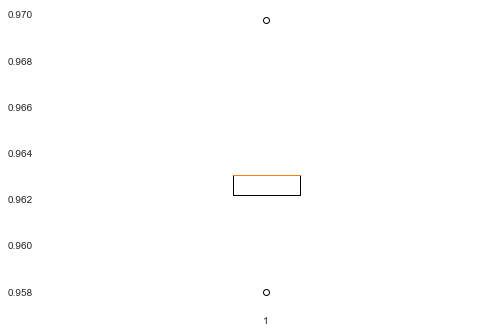

In [64]:
#Model Evaluation - KFold
from sklearn import metrics
kFold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)
scores = cross_val_score(estimator=lReg,  X=X_train, y=y_train, cv=kFold, scoring='recall')
plt.boxplot(scores)
plt.show()

In [65]:
predictions= lReg.predict(X_test)

trainAccuracy = lReg.score(X_train, y_train)*100
testAccuracy = lReg.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracy))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracy))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictions)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictions))




Accuracy on training set: 88.953%. 

Accuracy on test set: 88.812%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.75      0.46      0.57       488
           1       0.90      0.97      0.94      2551

    accuracy                           0.89      3039
   macro avg       0.83      0.71      0.75      3039
weighted avg       0.88      0.89      0.88      3039


Confusion Report:
 [[ 224  264]
 [  76 2475]]


__Observation:__
* Model is yielding good results, let's see if we can improve it with upsampling

__Upsampling with SMOTE:__

In [66]:
from imblearn.over_sampling import SMOTE
#Checking Count before Upsampling
print("Before Upsampling, counts of label 'Yes': {}".format(sum(y_train==1)))
print("Before UsSampling, counts of label 'No': {} \n".format(sum(y_train==0)))


Before Upsampling, counts of label 'Yes': 5949
Before UsSampling, counts of label 'No': 1139 



In [67]:
#Upsampling Using SMOTE
sm = SMOTE(sampling_strategy = 1 ,k_neighbors = 5, random_state=1)   
X_train_up, y_train_up = sm.fit_sample(X_train, y_train)

In [68]:
#Data After Upsampling
print("After Upampling, counts of label 'Yes': {}".format(sum(y_train_up==1)))
print("After Upsampling, counts of label 'No': {} \n".format(sum(y_train_up==0)))

After Upampling, counts of label 'Yes': 5949
After Upsampling, counts of label 'No': 5949 



In [69]:
#Data Shape after Up Sampling
print('After UpSampling, the shape of X_train_up: {}'.format(X_train_up.shape))
print('After UpSampling, the shape of y_train_up: {} \n'.format(y_train_up.shape))

After UpSampling, the shape of X_train_up: (11898, 32)
After UpSampling, the shape of y_train_up: (11898,) 



In [70]:
lRegUp = LogisticRegression(random_state = 1)
#Fitting logistic regression model to training data set 
lRegUp.fit(X_train_up, y_train_up)

LogisticRegression(random_state=1)

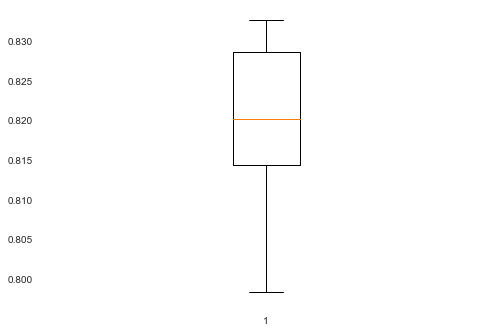

In [71]:
#Model Evaluation - KFold
from sklearn import metrics
kFold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)
scores = cross_val_score(estimator=lRegUp,  X=X_train_up, y=y_train_up, cv=kFold, scoring='recall')
plt.boxplot(scores)
plt.show()

In [72]:
predictionsUp= lRegUp.predict(X_test)

trainAccuracyUp = lRegUp.score(X_train, y_train)*100
testAccuracyUp = lRegUp.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracyUp))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracyUp))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictionsUp)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictionsUp))




Accuracy on training set: 79.698%. 

Accuracy on test set: 79.105%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.42      0.74      0.53       488
           1       0.94      0.80      0.87      2551

    accuracy                           0.79      3039
   macro avg       0.68      0.77      0.70      3039
weighted avg       0.86      0.79      0.81      3039


Confusion Report:
 [[ 362  126]
 [ 509 2042]]


__Observation:__
* Both the accuracy of the training and testing decreased but the Model is still yielding good results, let's see if we can improve it with down sampling

__Undersampling:__

In [73]:
#Checking Count before under Sampling
print("Before Undersampling, counts of label 'Yes': {}".format(sum(y_train==1)))
print("Before Undersampling, counts of label 'No': {} \n".format(sum(y_train==0)))

Before Undersampling, counts of label 'Yes': 5949
Before Undersampling, counts of label 'No': 1139 



In [74]:
from imblearn.under_sampling import RandomUnderSampler
#Under Sampling Using RandomUnderSampler
lRegUnder = RandomUnderSampler(random_state = 1)
X_train_Under, y_train_Under = lRegUnder.fit_sample(X_train, y_train)

In [75]:
#Data After Under sampling
print("After Undersampling, counts of label 'Yes': {}".format(sum(y_train_Under==1)))
print("After Undersampling, counts of label 'No': {} \n".format(sum(y_train_Under==0)))

After Undersampling, counts of label 'Yes': 1139
After Undersampling, counts of label 'No': 1139 



In [76]:
#Data Shape after Up Sampling
print('After UnderSampling, the shape of X_train_up: {}'.format(X_train_Under.shape))
print('After UnderSampling, the shape of y_train_up: {} \n'.format(y_train_Under.shape))

After UnderSampling, the shape of X_train_up: (2278, 32)
After UnderSampling, the shape of y_train_up: (2278,) 



In [77]:
lRegUnder = LogisticRegression(random_state = 1)
#Fitting logistic regression model to training data set 
lRegUnder.fit(X_train_Under, y_train_Under)

LogisticRegression(random_state=1)

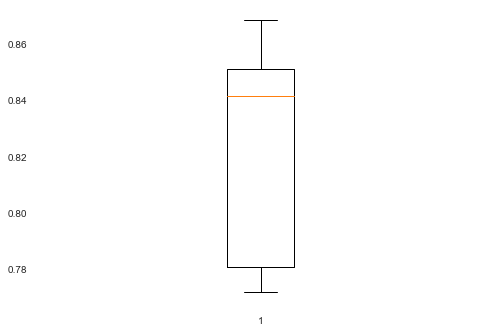

In [78]:
#Model Evaluation - KFold
from sklearn import metrics
kFold=StratifiedKFold(n_splits=5,shuffle=True,random_state=1)
scores = cross_val_score(estimator=lRegUnder,  X=X_train_Under, y=y_train_Under, cv=kFold, scoring='recall')
plt.boxplot(scores)
plt.show()

In [79]:
predictionsUnder= lRegUnder.predict(X_test)

trainAccuracyUnder = lRegUnder.score(X_train, y_train)*100
testAccuracyUnder = lRegUnder.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracyUnder))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracyUnder))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictionsUnder)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictionsUnder))

Accuracy on training set: 80.502%. 

Accuracy on test set: 79.796%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.43      0.81      0.56       488
           1       0.96      0.80      0.87      2551

    accuracy                           0.80      3039
   macro avg       0.69      0.80      0.72      3039
weighted avg       0.87      0.80      0.82      3039


Confusion Report:
 [[ 395   93]
 [ 521 2030]]


__Observation:__
    
* Both the accuracy of the training and testing increased a little bit. Let's try to tweak some parameters to see if we can improve it

__Regularization:__

In [80]:
"""
# Choose the type of classifier. 
lr_estimator = LogisticRegression(random_state=1,solver='saga')

# Grid of parameters to choose from
parameters = {'C': np.arange(0.1,1.1,0.1)}

# Run the grid search
grid_obj = GridSearchCV(lr_estimator, parameters, scoring='recall')
grid_obj = grid_obj.fit(X_train_up, y_train_up)

# Set the clf to the best combination of parameters
lr_estimator = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
lr_estimator.fit(X_train_up, y_train_up)
"""


"\n# Choose the type of classifier. \nlr_estimator = LogisticRegression(random_state=1,solver='saga')\n\n# Grid of parameters to choose from\nparameters = {'C': np.arange(0.1,1.1,0.1)}\n\n# Run the grid search\ngrid_obj = GridSearchCV(lr_estimator, parameters, scoring='recall')\ngrid_obj = grid_obj.fit(X_train_up, y_train_up)\n\n# Set the clf to the best combination of parameters\nlr_estimator = grid_obj.best_estimator_\n\n# Fit the best algorithm to the data. \nlr_estimator.fit(X_train_up, y_train_up)\n"

__Hyperparameter Tuning - Grid Search:__

In [82]:
%time

pipelineLR = make_pipeline(StandardScaler(), LogisticRegression(random_state=1, penalty='l2', solver='saga'))

# Parameter Grid
param_grid_lr = [{'logisticregression__C': [0.001, 0.01, 0.05, 0.1, 0.5, 1.0, 10.0,15.0,30.0],}]

# Scoring to be used
scorer = metrics.make_scorer(metrics.recall_score)

# GridSearch Cross-validation estimator
GridSearchLR = GridSearchCV(estimator=pipelineLR, 
                     param_grid = param_grid_lr,
                     scoring=scorer,
                     cv=5,
                     refit=True,
                     n_jobs=1)

# LogisticRegression Classifier Train
GridSearchLR.fit(X_train, y_train)
print("Best Parameters:{} \nScore: {}".format(GridSearchLR.best_params_, GridSearchLR.best_score_))

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 4.05 µs
Best Parameters:{'logisticregression__C': 0.001} 
Score: 0.9989915966386554


In [83]:
#Building New Pipeline with Best Parameters
npipelineLR = make_pipeline(StandardScaler(), LogisticRegression(C=1.0))
npipelineLR.fit(X_train, y_train)
npredictionsLR= npipelineLR.predict(X_test)
ntrainLR = npipelineLR.score(X_train, y_train)*100
ntestLR = npipelineLR.score(X_test, y_test)*100

print()
print("Accuracy on training set: {:.3f}%. \n".format(ntrainLR))
print("Accuracy on test set: {:.3f}%. \n".format(ntestLR))

#Logistic Regression GridSearchCV Classification Report
print("Classification Report: \n",classification_report(y_test, npredictionsLR)) 
print()

#Logistic Regression GridSearchCV Confusion matrix
print("Confusion Report:\n",confusion_matrix(y_test,npredictionsLR))


Accuracy on training set: 90.942%. 

Accuracy on test set: 90.128%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.76      0.56      0.65       488
           1       0.92      0.97      0.94      2551

    accuracy                           0.90      3039
   macro avg       0.84      0.76      0.79      3039
weighted avg       0.89      0.90      0.89      3039


Confusion Report:
 [[ 273  215]
 [  85 2466]]


__Observation:__
    
* Both the accuracy of the training and testing scores improved with GridSearch. Let's try RandomSearchCV

__Hyperparameter Tuning - Random Search:__

In [84]:
%time

pipelineLR_rand = make_pipeline(StandardScaler(), LogisticRegression(random_state=1, penalty='l2', solver='saga'))

# Parameter Grid
param_grid_lr_rand = [{'logisticregression__C': [0.0001, 0.01, 0.05, 0.80, 0.1, 0.5, 1.0,20.0,30.0],}]

# Scoring to be used
scorer = metrics.make_scorer(metrics.recall_score)

# GridSearch Cross-validation estimator
randomSearchLR = RandomizedSearchCV(estimator=pipelineLR_rand, 
                     param_distributions = param_grid_lr_rand,
                     scoring=scorer,
                     cv=5,
                     refit=True,
                     n_jobs=1)

# LogisticRegression Classifier Train
randomSearchLR = randomSearchLR.fit(X_train, y_train)
print("Best Parameters:{} \nScore: {}".format(randomSearchLR.best_params_, GridSearchLR.best_score_))

CPU times: user 2 µs, sys: 1 µs, total: 3 µs
Wall time: 5.25 µs
Best Parameters:{'logisticregression__C': 0.0001} 
Score: 0.9989915966386554


In [85]:
# Building new Pipeline with Best Parameters
npipelineLR_rand = make_pipeline(StandardScaler(), LogisticRegression(C=0.0001))
# Fit the model on training data
npipelineLR_rand.fit(X_train, y_train)
npredictionsLR_rand= npipelineLR_rand.predict(X_test)
ntrainLR_rand = npipelineLR_rand.score(X_train, y_train)*100
ntestLR_rand = npipelineLR_rand.score(X_test, y_test)*100

print()
print("Accuracy on training set: {:.3f}%. \n".format(ntrainLR_rand))
print("Accuracy on test set: {:.3f}%. \n".format(ntestLR_rand))

#Logistic Regression RandomizedSearchCV Classification Report
print("Classification Report: \n",classification_report(y_test, npredictionsLR_rand)) 
print()

#Logistic Regression RandomizedSearchCV Confusion matrix
print("Confusion Report:\n",confusion_matrix(y_test,npredictionsLR_rand))


Accuracy on training set: 83.931%. 

Accuracy on test set: 83.942%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       488
           1       0.84      1.00      0.91      2551

    accuracy                           0.84      3039
   macro avg       0.42      0.50      0.46      3039
weighted avg       0.70      0.84      0.77      3039


Confusion Report:
 [[   0  488]
 [   0 2551]]


__Observation:__
    
* Both the accuracy of the training and testing scores decreased with RandomSearch but still yielding good results. Let's different model

__Model building - Bagging and Boosting:__

__Decision Tree:__

In [86]:
dTree = DecisionTreeClassifier().fit(X_train,y_train)

In [87]:
predictions_dTree= dTree.predict(X_test)

trainAccuracy_dTree = dTree.score(X_train, y_train)*100
testAccuracy_dTree = dTree.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracy_dTree))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracy_dTree))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictions_dTree)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictions_dTree))

Accuracy on training set: 100.000%. 

Accuracy on test set: 93.090%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       488
           1       0.96      0.96      0.96      2551

    accuracy                           0.93      3039
   macro avg       0.87      0.87      0.87      3039
weighted avg       0.93      0.93      0.93      3039


Confusion Report:
 [[ 378  110]
 [ 100 2451]]


__Observation:__
    
* The Accuracy on the training set is 100% and 93% on the testing set. Le's tweak some parameters to see is we can increase testing accuracy

__Hyperparameter Tuning - Grid Search:__

In [88]:
%%time

# Creating pipeline
pipelinedDT = make_pipeline(StandardScaler(), DecisionTreeClassifier(random_state=1))

# Parameter grid
param_grid_dTree = {
    "decisiontreeclassifier__criterion": ['gini','entropy'],
    "decisiontreeclassifier__max_depth": [5, 10, 15, 20],
    "decisiontreeclassifier__min_samples_split": [4,7,11,12,15,1000]
}
# Scoring to be used
scorer = metrics.make_scorer(metrics.recall_score)

# GridSearch Cross-validation estimator
gridSearchDT = GridSearchCV(estimator=pipelinedDT, param_grid=param_grid_dTree, scoring=scorer, cv=5)

# Fitting parameters to GridSeachCV
gridSearchDT.fit(X_train, y_train)

print( "Best Parameters:{} \nScore: {}".format(gridSearchDT.best_params_, gridSearchDT.best_score_))

Best Parameters:{'decisiontreeclassifier__criterion': 'gini', 'decisiontreeclassifier__max_depth': 10, 'decisiontreeclassifier__min_samples_split': 4} 
Score: 0.9648685782134553
CPU times: user 8.43 s, sys: 144 ms, total: 8.57 s
Wall time: 8.58 s


In [89]:
# Creating new pipeline with best parameters
npipelinedDT = make_pipeline(StandardScaler(),DecisionTreeClassifier(random_state=1, criterion='gini', max_depth=10, min_samples_split=4),)

# Fitting model on training data
npipelinedDT.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(max_depth=10, min_samples_split=4,
                                        random_state=1))])

In [90]:
npredictionsdtree= npipelinedDT.predict(X_test)

ntrainAccuracydtree = npipelinedDT.score(X_train, y_train)*100
ntestAccuracydtree= npipelinedDT.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracydtree))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracydtree))

#Classification Report
print("Classification Report: \n",classification_report(y_test, npredictionsdtree)) 
print()

#Decision Tree Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionsdtree))

Accuracy on training set: 98.533%. 

Accuracy on test set: 94.011%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.81      0.82      0.81       488
           1       0.96      0.96      0.96      2551

    accuracy                           0.94      3039
   macro avg       0.89      0.89      0.89      3039
weighted avg       0.94      0.94      0.94      3039


Confusion Report:
 [[ 398   90]
 [  92 2459]]


__Hyperparameter Tuning - Random Search:__

In [91]:
# Creating pipeline
pipelineDT_rand = make_pipeline(StandardScaler(), DecisionTreeClassifier(random_state=1))

# Parameter grid
param_grid_rand = {
    
     "decisiontreeclassifier__criterion": ['gini','entropy'],
    "decisiontreeclassifier__max_depth": [3, 4, 5, None],
    "decisiontreeclassifier__min_samples_split": [2,4,7,10,15]
}

# Scoring to be used
scorer = metrics.make_scorer(metrics.recall_score)

# RandomSearchCV Cross-validation estimator
randomSearchDT = RandomizedSearchCV(estimator=pipelineDT_rand, param_distributions=param_grid_rand, n_iter=20, scoring=scorer, cv=5, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomSearchDT.fit(X_train,y_train)

print("Best Parameters:{} \nScore: {}" .format(randomSearchDT.best_params_,randomSearchDT.best_score_))

Best Parameters:{'decisiontreeclassifier__min_samples_split': 7, 'decisiontreeclassifier__max_depth': 4, 'decisiontreeclassifier__criterion': 'entropy'} 
Score: 0.9734395827296435


In [92]:
# Creating new pipeline with best parameters
npipelineDT_rand = make_pipeline(
    StandardScaler(),
    DecisionTreeClassifier(random_state=1, criterion='entropy', max_depth=4, min_samples_split=7),
)

# Fit the model on training data
npipelineDT_rand.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('decisiontreeclassifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=4,
                                        min_samples_split=7, random_state=1))])

In [93]:
npredictionsdtree_rand= npipelineDT_rand.predict(X_test)

ntrainAccuracydtree_rand = npipelineDT_rand.score(X_train, y_train)*100
ntestAccuracydtree_rand = npipelineDT_rand.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracydtree_rand))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracydtree_rand))

#Classification Report
print("Classification Report: \n",classification_report(y_test, npredictionsdtree_rand)) 
print()

#Decision Tree RandomSearchCV Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionsdtree_rand))

Accuracy on training set: 92.819%. 

Accuracy on test set: 92.333%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.87      0.62      0.72       488
           1       0.93      0.98      0.96      2551

    accuracy                           0.92      3039
   macro avg       0.90      0.80      0.84      3039
weighted avg       0.92      0.92      0.92      3039


Confusion Report:
 [[ 302  186]
 [  47 2504]]


__Random Forest:__

In [94]:
randomForest = RandomForestClassifier(random_state=1)
randomForest.fit(X_train,y_train)

RandomForestClassifier(random_state=1)

In [95]:
predictions_randomForest= randomForest.predict(X_test)

trainAccuracy_randomForest = randomForest.score(X_train, y_train)*100
testAccuracy_randomForest = randomForest.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracy_randomForest))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracy_randomForest))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictions_dTree)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictions_dTree))

Accuracy on training set: 100.000%. 

Accuracy on test set: 95.031%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.79      0.77      0.78       488
           1       0.96      0.96      0.96      2551

    accuracy                           0.93      3039
   macro avg       0.87      0.87      0.87      3039
weighted avg       0.93      0.93      0.93      3039


Confusion Report:
 [[ 378  110]
 [ 100 2451]]


__Hyperparameters Tuning - GridSearch:__

In [96]:
RandomForestClassifier().get_params().keys()

dict_keys(['bootstrap', 'ccp_alpha', 'class_weight', 'criterion', 'max_depth', 'max_features', 'max_leaf_nodes', 'max_samples', 'min_impurity_decrease', 'min_impurity_split', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf', 'n_estimators', 'n_jobs', 'oob_score', 'random_state', 'verbose', 'warm_start'])

In [97]:
%%time

# Creating pipeline
pipelineRF = make_pipeline(StandardScaler(),  RandomForestClassifier(criterion='gini', random_state=1))

# Parameter grid
param_grid_RF= [{
    'randomforestclassifier__max_depth':[2, 3, 4],
    'randomforestclassifier__max_features':[2, 3, 4, 5, 6]
}]

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#GridSearchCV Cross-validation estimator
gridSearchRF = GridSearchCV(estimator=pipelineRF, param_grid = param_grid_RF,scoring=scorer,cv=5)
# Fitting parameters in GridSeachCV
gridSearchRF.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(gridSearchRF.best_params_, gridSearchRF.best_score_)
)

Best Parameters:{'randomforestclassifier__max_depth': 2, 'randomforestclassifier__max_features': 2} 
Score: 1.0
CPU times: user 17.1 s, sys: 218 ms, total: 17.3 s
Wall time: 17.4 s


In [98]:
# Creating new pipeline with best parameters
npipelineRF = make_pipeline( StandardScaler(),RandomForestClassifier (random_state=1,max_features=2, max_depth=2),)

# Fit the model on training data
npipelineRF.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=2, max_features=2,
                                        random_state=1))])

In [99]:
npredictionsdRF= npipelineRF.predict(X_test)

ntrainAccuracydRF = npipelineRF.score(X_train, y_train)*100
ntestAccuracyRF = npipelineRF.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracydRF))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracydtree_rand))

#Classification Report
print("Classification Report: \n",classification_report(y_test,npredictionsdRF )) 
print()

#Decision Tree GridSearchCV Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionsdRF))

Accuracy on training set: 83.931%. 

Accuracy on test set: 92.333%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       488
           1       0.84      1.00      0.91      2551

    accuracy                           0.84      3039
   macro avg       0.42      0.50      0.46      3039
weighted avg       0.70      0.84      0.77      3039


Confusion Report:
 [[   0  488]
 [   0 2551]]


__Hyperparameter Tuning - Random Search:__

In [100]:
%%time

# Creating pipeline
pipelineRF_rand = make_pipeline(StandardScaler(),  RandomForestClassifier(criterion='gini', random_state=1))

# Parameter grid
param_grid_RF_rand= [{
    'randomforestclassifier__max_depth':[2, 3, 4],
    'randomforestclassifier__max_features':[2, 3, 4, 5, 6]
}]

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
randomSearchRF_rand = RandomizedSearchCV(estimator=pipelineRF_rand, param_distributions=param_grid_RF_rand, n_iter=20, scoring=scorer, cv=5, random_state=1)


# Fitting parameters in GridSeachCV
randomSearchRF_rand.fit(X_train, y_train)

print("Best Parameters:{} \nScore: {}".format(randomSearchRF_rand .best_params_, randomSearchRF_rand.best_score_))


Best Parameters:{'randomforestclassifier__max_features': 2, 'randomforestclassifier__max_depth': 2} 
Score: 1.0
CPU times: user 17.5 s, sys: 229 ms, total: 17.8 s
Wall time: 17.8 s


In [101]:
# Creating new pipeline with best parameters
npipelineRF_rand = make_pipeline( StandardScaler(),RandomForestClassifier (random_state=1,max_features=2, max_depth=2),)

# Fit the model on training data
npipelineRF_rand.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=2, max_features=2,
                                        random_state=1))])

In [102]:
npredictionsRF_rand= npipelineRF_rand.predict(X_test)

ntrainAccuracyRF_rand = npipelineRF_rand.score(X_train, y_train)*100
ntestAccuracyRF_rand = npipelineRF_rand.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracyRF_rand))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracyRF_rand))

#Classification Report
print("Classification Report: \n",classification_report(y_test,npredictionsRF_rand )) 
print()

#Decision Tree GridSearchCV Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionsRF_rand))

Accuracy on training set: 83.931%. 

Accuracy on test set: 83.942%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       488
           1       0.84      1.00      0.91      2551

    accuracy                           0.84      3039
   macro avg       0.42      0.50      0.46      3039
weighted avg       0.70      0.84      0.77      3039


Confusion Report:
 [[   0  488]
 [   0 2551]]


__Bagging Classifier:__

In [103]:
baggingClassifier = BaggingClassifier(random_state=1)
baggingClassifier.fit(X_train,y_train)

BaggingClassifier(random_state=1)

In [104]:
predictionsBagging= baggingClassifier.predict(X_test)

trainAccuracyBagging = baggingClassifier.score(X_train, y_train)*100
testAccuracyBagging = baggingClassifier.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracyBagging))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracyBagging))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictionsBagging)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictionsBagging))

Accuracy on training set: 99.732%. 

Accuracy on test set: 94.735%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.85      0.81      0.83       488
           1       0.96      0.97      0.97      2551

    accuracy                           0.95      3039
   macro avg       0.91      0.89      0.90      3039
weighted avg       0.95      0.95      0.95      3039


Confusion Report:
 [[ 397   91]
 [  69 2482]]


__Xgboost:__

In [105]:
xgboostC = XGBClassifier(random_state=1)
xgboostC.fit(X_train,y_train)

[03:17:21] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=8, num_parallel_tree=1, random_state=1,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [106]:
predictionXgb= xgboostC.predict(X_test)

trainAccuracyXgb = xgboostC.score(X_train, y_train)*100
testAccuracyXgb = xgboostC.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracyXgb))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracyXgb))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictionXgb)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictionXgb))

Accuracy on training set: 100.000%. 

Accuracy on test set: 97.038%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.94      0.88      0.90       488
           1       0.98      0.99      0.98      2551

    accuracy                           0.97      3039
   macro avg       0.96      0.93      0.94      3039
weighted avg       0.97      0.97      0.97      3039


Confusion Report:
 [[ 427   61]
 [  29 2522]]


__Hypertunning - Grid Search:__

In [107]:
%%time 

# Creating pipeline
pipelineXgb = make_pipeline(StandardScaler(), XGBClassifier(random_state=1, eval_metric="logloss"))

# Parameter grid to pass in GridSearchCV
param_grid_Xgb = {
    "xgbclassifier__n_estimators": np.arange(50, 300, 50),
    "xgbclassifier__scale_pos_weight": [0, 1, 2, 5, 10],
    "xgbclassifier__learning_rate": [0.01, 0.1, 0.2, 0.05],
    "xgbclassifier__gamma": [0, 1, 3, 5],
    "xgbclassifier__subsample": [0.7, 0.8, 0.9, 1],
}
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
gridSearchXgb = GridSearchCV(estimator=pipelineXgb, param_grid=param_grid_Xgb, scoring=scorer, cv=5)

# Fitting parameters in GridSeachCV
gridSearchXgb.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(gridSearchXgb.best_params_, gridSearchXgb.best_score_)
)

Best Parameters:{'xgbclassifier__gamma': 0, 'xgbclassifier__learning_rate': 0.01, 'xgbclassifier__n_estimators': 50, 'xgbclassifier__scale_pos_weight': 10, 'xgbclassifier__subsample': 0.7} 
Score: 0.9979830519255642
CPU times: user 8h 38min 27s, sys: 5min 15s, total: 8h 43min 42s
Wall time: 1h 8min 42s


In [108]:
# Creating new pipeline with best parameters
npipelineXgb = make_pipeline(
    StandardScaler(),
    XGBClassifier(
        random_state=1,
        n_estimators=50,
        scale_pos_weight=10,
        subsample=0.9,
        learning_rate=0.01,
        gamma=3,
    ),
)

# Fitting Model
npipelineXgb .fit(X_train, y_train)

[04:26:03] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=3, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='', learning_rate=0.01,
                               max_delta_step=0, max_depth=6,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=8, num_parallel_tree=1, random_state=1,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=10,
                               subsample=0.9, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

In [109]:
npredictionXgb= npipelineXgb.predict(X_test)

ntrainAccuracyXgb = npipelineXgb.score(X_train, y_train)*100
ntestAccuracyXgb = npipelineXgb.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracyXgb))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracyXgb))

#Classification Report
print("Classification Report: \n",classification_report(y_test,npredictionXgb)) 
print()

#Decision Tree GridSearchCV Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionXgb))

Accuracy on training set: 89.447%. 

Accuracy on test set: 89.174%. 

Classification Report: 
               precision    recall  f1-score   support

           0       1.00      0.33      0.49       488
           1       0.89      1.00      0.94      2551

    accuracy                           0.89      3039
   macro avg       0.94      0.66      0.72      3039
weighted avg       0.90      0.89      0.87      3039


Confusion Report:
 [[ 159  329]
 [   0 2551]]


__Hypertunning - Random Search:__

In [110]:
#Creating pipeline
pipelineXgb_rand=make_pipeline(StandardScaler(),XGBClassifier(random_state=1))

#Parameter grid
param_grid_xgb_rand={'xgbclassifier__n_estimators':np.arange(50,300,50),'xgbclassifier__scale_pos_weight':[0,1,2,5,10],
            'xgbclassifier__learning_rate':[0.01,0.1,0.2,0.05], 'xgbclassifier__gamma':[0,1,3,5],
            'xgbclassifier__subsample':[0.7,0.8,0.9,1]}

# Scorer Value
scorer = metrics.make_scorer(metrics.recall_score)

#RandomizedSearchCV
randomSearchXgb = RandomizedSearchCV(estimator=pipelineXgb_rand, param_distributions=param_grid_xgb_rand, n_iter=50, scoring=scorer, cv=5, random_state=1)

#Fitting parameters to RandomizedSearchCV
randomSearchXgb.fit(X_train,y_train)

print("Best Parameters:{} \nScore: {}" .format(randomSearchXgb.best_params_,randomSearchXgb.best_score_))

[04:26:04] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:05] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:06] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:06] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:26:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:26:33] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:34] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:34] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:34] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:26:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:26:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:27:10] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:11] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:12] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:13] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:27:22] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:27:37] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:38] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:40] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:27:57] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:57] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:57] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:27:58] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

[04:28:09] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:28:09] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:28:09] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[04:28:10] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective

In [111]:
# Creating new pipeline with best parameters
npipelineXgb_rand = make_pipeline(
    StandardScaler(),
    XGBClassifier(
        random_state=1,
        n_estimators=200,
        scale_pos_weight=10,
        subsample=0.9,
        learning_rate=0.05,
        gamma=5,
    ),
)

# Fit the model on training data
npipelineXgb_rand.fit(X_train, y_train)

[04:28:12] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=5, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='', learning_rate=0.05,
                               max_delta_step=0, max_depth=6,
                               min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=200,
                               n_jobs=8, num_parallel_tree=1, random_state=1,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=10,
                               subsample=0.9, tree_method='exact',
                               validate_parameters=1, verbosity=None))])

In [112]:
npredictionXgb_rand= npipelineXgb_rand.predict(X_test)

ntrainAccuracyXgb_rand = npipelineXgb_rand.score(X_train, y_train)*100
ntestAccuracyXgb_rand = npipelineXgb_rand.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracyXgb_rand))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracyXgb))

#Classification Report
print("Classification Report: \n",classification_report(y_test,npredictionXgb_rand)) 
print()

#Decision Tree GridSearchCV Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionXgb_rand))

Accuracy on training set: 98.095%. 

Accuracy on test set: 89.174%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.98      0.76      0.85       488
           1       0.96      1.00      0.98      2551

    accuracy                           0.96      3039
   macro avg       0.97      0.88      0.91      3039
weighted avg       0.96      0.96      0.96      3039


Confusion Report:
 [[ 369  119]
 [   9 2542]]


__AdaBoost:__

In [113]:
adaboostC = AdaBoostClassifier(random_state=1)
adaboostC.fit(X_train,y_train)

AdaBoostClassifier(random_state=1)

In [114]:
predictionAdaC= adaboostC.predict(X_test)

trainAccuracyAdaC = adaboostC.score(X_train, y_train)*100
testAccuracyAdaC = adaboostC.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracyAdaC))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracyAdaC))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictionAdaC)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictionAdaC))

Accuracy on training set: 96.120%. 

Accuracy on test set: 96.018%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.90      0.85      0.87       488
           1       0.97      0.98      0.98      2551

    accuracy                           0.96      3039
   macro avg       0.93      0.92      0.92      3039
weighted avg       0.96      0.96      0.96      3039


Confusion Report:
 [[ 415   73]
 [  48 2503]]


__Hypertunning - Grid Search:__

In [115]:
%%time 

# Creating pipeline
pipelineAdaC = make_pipeline(StandardScaler(), AdaBoostClassifier(random_state=1))

# Parameter grid
param_grid_AdaC = {
    "adaboostclassifier__n_estimators": np.arange(10, 110, 10),
    "adaboostclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "adaboostclassifier__base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Scorer
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCVpipelineAdaC
gridSearchAdaC = GridSearchCV(estimator=pipelineAdaC, param_grid=param_grid_AdaC, scoring=scorer, cv=5)

# Fitting parameters in GridSeachCV
gridSearchAdaC.fit(X_train, y_train)

print("Best Parameters:{} \nScore: {}".format(gridSearchAdaC.best_params_, gridSearchAdaC.best_score_))

Best Parameters:{'adaboostclassifier__base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1), 'adaboostclassifier__learning_rate': 0.1, 'adaboostclassifier__n_estimators': 10} 
Score: 1.0
CPU times: user 7min 13s, sys: 4.56 s, total: 7min 17s
Wall time: 7min 22s


In [116]:
# Creating new pipeline with best parameters
npipelineAdaC = make_pipeline(
    StandardScaler(),
    AdaBoostClassifier(
        base_estimator=DecisionTreeClassifier(max_depth=1, random_state=1),
        n_estimators=10,
        learning_rate=0.1,
        random_state=1,
    ),
)

# Fit the model on training data
npipelineAdaC.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('adaboostclassifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                                          random_state=1),
                                    learning_rate=0.1, n_estimators=10,
                                    random_state=1))])

In [117]:
npredictionAdaC= npipelineAdaC.predict(X_test)

ntrainAccuracyAdaC = npipelineAdaC.score(X_train, y_train)*100
ntestAccuracyAdaC = npipelineAdaC.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracyAdaC))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracyAdaC))

#Classification Report
print("Classification Report: \n",classification_report(y_test, npredictionAdaC))

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionAdaC))

Accuracy on training set: 83.931%. 

Accuracy on test set: 83.942%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.00      0.00      0.00       488
           1       0.84      1.00      0.91      2551

    accuracy                           0.84      3039
   macro avg       0.42      0.50      0.46      3039
weighted avg       0.70      0.84      0.77      3039

Confusion Report:
 [[   0  488]
 [   0 2551]]


__Hypertunning - Random Search:__

In [118]:
%%time

# Creating pipeline
pipelineAdaC_rand = make_pipeline(StandardScaler(), AdaBoostClassifier(random_state=1))

# Parameter grid to pass in GridSearchCV
              
param_grid_AdaC = {
    "adaboostclassifier__n_estimators": np.arange(10, 110, 10),
    "adaboostclassifier__learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "adaboostclassifier__base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}
   
# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
RandomSearchAdaC= RandomizedSearchCV(estimator=pipelineAdaC_rand, param_distributions=param_grid_AdaC, scoring=scorer, cv=5, random_state=1)


#Fitting parameters in RandomizedSearchCV
RandomSearchAdaC.fit(X_train,y_train)

print("Best Parameters:{} \nScore: {}:" .format(RandomSearchAdaC.best_params_,RandomSearchAdaC.best_score_))

Best Parameters:{'adaboostclassifier__n_estimators': 50, 'adaboostclassifier__learning_rate': 0.01, 'adaboostclassifier__base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1)} 
Score: 1.0:
CPU times: user 24.4 s, sys: 284 ms, total: 24.7 s
Wall time: 25 s


In [119]:
# Creating new pipeline with best parameters
npipelineAdaC_rand = make_pipeline(
    StandardScaler(),
    AdaBoostClassifier(
        base_estimator=DecisionTreeClassifier(max_depth=1, random_state=1),
        n_estimators=50,
        learning_rate=0.1,
        random_state=1,
    ), 
)

# Fit the model on training data
npipelineAdaC_rand.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('adaboostclassifier',
                 AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                                          random_state=1),
                                    learning_rate=0.1, random_state=1))])

In [120]:
npredictionAdaC_rand = npipelineAdaC_rand .predict(X_test)

ntrainAccuracyAdaC_rand =npipelineAdaC_rand.score(X_train, y_train)*100
ntestAccuracyAdaC_rand = npipelineAdaC_rand.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(ntrainAccuracyAdaC_rand))
print("Accuracy on test set: {:.3f}%. \n".format(ntestAccuracyAdaC_rand))

#Classification Report
print("Classification Report: \n",classification_report(y_test, npredictionAdaC_rand ))

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,npredictionAdaC_rand ))

Accuracy on training set: 89.376%. 

Accuracy on test set: 88.648%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.92      0.32      0.48       488
           1       0.88      0.99      0.94      2551

    accuracy                           0.89      3039
   macro avg       0.90      0.66      0.71      3039
weighted avg       0.89      0.89      0.86      3039

Confusion Report:
 [[ 157  331]
 [  14 2537]]


__Gradient Boosting:__

In [121]:
gbC = GradientBoostingClassifier(random_state=1)
gbC.fit(X_train,y_train)

GradientBoostingClassifier(random_state=1)

In [122]:
predictiongbC= gbC.predict(X_test)

trainAccuracygbC = gbC.score(X_train, y_train)*100
testAccuracygbC= gbC.score(X_test, y_test)*100

#Accuracy on Data Set
print("Accuracy on training set: {:.3f}%. \n".format(trainAccuracygbC))
print("Accuracy on test set: {:.3f}%. \n".format(testAccuracygbC))

#Classification Report
print("Classification Report: \n",classification_report(y_test, predictiongbC)) 
print()

#Logistic Regression Confusion matrix
print("Confusion Report:\n", confusion_matrix(y_test,predictiongbC))

Accuracy on training set: 97.714%. 

Accuracy on test set: 96.315%. 

Classification Report: 
               precision    recall  f1-score   support

           0       0.93      0.83      0.88       488
           1       0.97      0.99      0.98      2551

    accuracy                           0.96      3039
   macro avg       0.95      0.91      0.93      3039
weighted avg       0.96      0.96      0.96      3039


Confusion Report:
 [[ 406   82]
 [  30 2521]]


__Model Comparaison:__

In [124]:
comp = {"Algorithm": ["Logistic Regression","Logistic Regression Upsampling", "Logistic Regression Downsampling", "Grid Search Logistic Regression","Logistic Regression RandomizedSearchCV", "Decision Tree", "Grid Search Decision Tree","Random Search Decision Tree","Random Forest", "Grid Search On Random Forest","Random Search On Random Forest","Bagging Classifer", "XGBoost","GridSearch on XGBoost","Random Search on XGBoost","AdaBoost","GridSearch on AdaBoost","Random Search on AdaBoost","Gradient Boosting"],
         "Test Score":[testAccuracy, testAccuracyUp, testAccuracyUnder, ntestLR,ntestLR_rand,testAccuracy_dTree,ntestAccuracydtree,ntestAccuracydtree_rand,testAccuracy_randomForest,ntestAccuracyRF,ntestAccuracyRF_rand,testAccuracyBagging,testAccuracyXgb,ntestAccuracyXgb,ntestAccuracyXgb_rand,testAccuracyAdaC,ntestAccuracyAdaC,ntestAccuracyAdaC_rand,testAccuracygbC],
        "Train Score":[trainAccuracy, trainAccuracyUp, trainAccuracyUnder,ntrainLR,ntrainLR_rand, trainAccuracy_dTree, ntrainAccuracydtree,ntrainAccuracydtree_rand,trainAccuracy_randomForest,ntrainAccuracydRF,ntrainAccuracyRF_rand,trainAccuracyBagging,trainAccuracyXgb,ntrainAccuracyXgb,ntrainAccuracyXgb_rand,trainAccuracyAdaC,ntrainAccuracyAdaC,ntrainAccuracyAdaC_rand,trainAccuracygbC],
        "Model":[predictions,predictionsUp,predictionsUnder,GridSearchLR,randomSearchLR,dTree,gridSearchDT, randomSearchDT, randomForest,gridSearchRF,randomSearchRF_rand,baggingClassifier,xgboostC,gridSearchXgb,randomSearchXgb,adaboostC,gridSearchAdaC,RandomSearchAdaC,gbC]}

comparision = pd.DataFrame(comp)

comparision

print("Best Performing Algorithm:",comparision.loc[comparision["Test Score"].idxmax(), 'Algorithm'])
print()
print("Best Test Score: ",comparision.loc[comparision["Test Score"].idxmax(), 'Test Score'])
print()
print("Best Train Score: ",comparision.loc[comparision["Test Score"].idxmax(), 'Train Score'])

Best Performing Algorithm: XGBoost

Best Test Score:  97.03849950641658

Best Train Score:  100.0


__Business Recommendation:__
* We have been able to build a predictive model:

a) that bank can deploy this model to identify customers who are at the risk of attrition.

b) that the bank can use to find the key causes that drive attrition.

c) based on which bank can take appropriate actions to build better retention policies for customers.

Factors that drive the attrition - Total_Trans_Ct, Total_Revolving_Bal, Total_Trans_Amt, Total_Relationship_Count
Total_Trans_Ct: Less number of transactions in a year leads to attrition of a customer - to increase the usage of cards the bank can provide offers like cashback, special discounts on the purchase of something, etc so that customers feel motivated to use their cards.

Total_Revolving_Bal: Customers with less total revolving balance are the ones who attrited, such customers must have cleared their dues and opted out of the credit card service. After the customer has cleared the dues bank can ask for a feedback on their experience and get to the casue of attrition.

Total_Trans_Amt: Less number of transactions can lead to less transaction amount and eventually leads to customer attrition - Bank can provide offers on the purchase of costlier items which in-turn will benefit the customers and bank both.

Total_Relationship_Count: Attrition is highest among the customers who are using 1 or 2 products offered by the bank - together they constitute ~55% of the attrition - Bank should investigate here to find the problems customers are facing with these products, customer support, or more transparency can help in retaining customers.

Female customers should be the target customers for any kind of marketing campaign as they are the ones who utilize their credits, make more and higher amount transactions. But their credit limit is less so increasing the credit limit for such customers can profit the bank.

Months_Inactive: As inactivity increases the attrition also increases, 2-4 months of inactivity are the biggest contributors of attrition -Bank can send automated messages to engage customers, these messages can be about their monthly activity, new offers or services, etc.

Highest attrition is among the customers who interacted/reached out the most with/to the bank, This indicates that the bank is not able to resolve the problems faced by customers leading to attrition - a feedback collection system can be set-up to check if the customers are satisfied with the resolution provided, if not, the bank should act upon it accordingly.
* While analysis the data, we noticed that the bank's data set was imbalance. Attrition Flag = 1 was higher than 0
* We also discover that the credit being given to members increases or decreases based on the membership level (blue, Gold, Platnimum, Silver)
* We also discovered that the inactive customers credit limit decreases over time as the length of their inactivity increased. Rather that starting to decrease these members limit, the bank should start an incentive to make these customers return. eg 500 usd bonus when you spend x amount over the next 3 month. This will attract new customers as well.
* The bank should also start a cash back program.
* Suprising enough Age did not has a noticebale impact on the Credit Limit. However, most customers at the bank seems to be older. The bank should invest in a program to attract young customers as study shows that most people will stay with their first bank.
* The bank also offers different membership level, however most of their customer (more than 50%) is at the Blue level. The bank should implement a program to upgrade membership level after a certain amount of time at the institution. 
* We also saw that most of the customers make less than 40K a year. With most of the member being on the older side, but with a higher level of graduate education level, this might suggest that most people are currently unemployed or retired.
* We also saw that most people have dependents, the bank should implement a family discount plan.
* XGBoost is the best performing Alorigthm with a 97% test score and a 100% training score.
* With more, information on the desired performance level, we can improve the model performace and attract more customers
